In [10]:
import os
import random
import torch
import cv2
import math
import sys
import json
import time
import glob
import numpy as np
import svgutils
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import shutil
from torchvision import transforms
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets
from torch.autograd import Variable
from scipy.optimize import linear_sum_assignment
from collections import defaultdict
from torch.autograd import Function
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch.nn.modules.module import Module
from pprint import pprint
from svgpathtools import svg2paths

In [11]:
prefix = ''
path = 'data/ready/'

In [13]:
def distance(x0, y0, x1, y1):
    return math.sqrt(pow(x0 - x1, 2) + pow(y0 - y1, 2))

def resizeImage(image, width=None, height=None, inter=cv2.INTER_AREA):

    dim = None
    (h, w) = image.shape[:2]

    if width is None and height is None:
        return image

    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)
    else:
        r = width / float(w)
        dim = (width, int(h * r))
        
    resized = cv2.resize(image, dim, interpolation = inter)

    return resized, r

In [14]:
def process(directory, width=1240):
    for folder in glob.glob(directory + '/*'):
        name = folder.split('/')[-1]
        imgPath = os.path.join(folder, 'original.jpg')
        img = cv2.imread(imgPath)
        h, w, c = img.shape
        resized, ratio = resizeImage(img, width=width)
        imgPath = os.path.join(folder, 'processed' + '.jpg')
        cv2.imwrite(imgPath, resized)
        print('Processed:', name)

In [15]:
process(prefix + path)

Processed: 18
Processed: 9
Processed: 0
Processed: 11
Processed: 7
Processed: 16
Processed: 6
Processed: 17
Processed: 1
Processed: 10
Processed: 8
Processed: 4
Processed: 15
Processed: 3
Processed: 12
Processed: 2
Processed: 13
Processed: 5
Processed: 14


In [16]:
class PathManager:
        
    def __init__(self, path, text):
        self.path = path
        self.text = text
    
    def distance(self, t1, t2):
        p1 = self.path.point(t1)
        p2 = self.path.point(t2)
        
        if p1 is None:
            p1 = self.path.start
        if p2 is None:
            p2 = self.path.end
            
        return distance(p1.real, p1.imag, p2.real, p2.imag)
    
    def tangentAngle(self, t, eps=0.0001):
#         tangent = self.path.unit_tangent(t)
        p1 = self.path.point(max(0, t - eps))
        p2 = self.path.point(min(1, t + eps))
                
        dx = p2.real - p1.real
        dy = p1.imag - p1.imag
        
        tangent = complex(dx, dy)
    
        return -math.atan2(tangent.imag, tangent.real)
        
    
    def findNextDistance(self, t, distance):
        lo = t
        hi = 1
        
        last = None
        
        while (lo <= hi):
            mid = (lo + hi) / 2
            if last == mid:
                break
            d = self.distance(t, mid)
            if (d < distance):
                lo = mid
            else:
                hi = mid
            last = mid
        
        return last
    
    def findMidDistance(self, lo, hi):
        last = None
        l = lo
        h = hi
        while (l <= h):
            mid = (l + h) / 2
            if last == mid:
                break

            d1 = self.distance(lo, mid)
            d2 = self.distance(mid, hi)

            if (d1 < d2):
                l = mid
            else:
                h = mid

            last = mid
            
        return last
    
    def segmentFixedDistance(self, distance, lo=0.0, hi=1.0):
        positions = [lo]
        while (lo < hi):
            nt = self.findNextDistance(lo, distance)
            positions.append(min(hi, nt))
            lo = nt
        
        points_x = []
        points_y = []
        radians = []
        
        for position in positions:
            point = self.path.point(position)
            angle = self.tangentAngle(position)
            points_x.append(point.real)
            points_y.append(point.imag)
            radians.append(angle)
        
        return list(zip(points_x, points_y, radians))
    
    def _segmentEqualDistance(self, maxDistance, lo=0.0, hi=1.0):
        if self.distance(lo, hi) > maxDistance:
            mid = self.findMidDistance(lo, hi)
            r1 = self._segmentEqualDistance(maxDistance, lo, mid)
            r2 = self._segmentEqualDistance(maxDistance, mid, hi)
            r1.pop()
            return r1 + r2
        else:
            return [lo, hi]
        
    def segmentEqualDistance(self, maxDistance, lo=0.0, hi=1.0):
        positions = self._segmentEqualDistance(maxDistance, lo, hi)
        points_x = []
        points_y = []
        radians = []
        
        for position in positions:
            point = self.path.point(position)
            angle = self.tangentAngle(position)
            points_x.append(point.real)
            points_y.append(point.imag)
            radians.append(angle)
        
        return list(zip(points_x, points_y, radians))
    
    def getText(self):
        return self.text
    
    def __str__(self):
        return 'Text: "%s"' % self.text
    
    def __repr__(self):
        return str(self)
        

class PaperManager:
    
    def __init__(self, path):
        self.name = path.split('/')[-1]
        self.img = os.path.join(path, 'processed.jpg')
        self.svg = os.path.join(path, 'lines.svg')
        self.txt = os.path.join(path, 'text.txt')
        paths, attributes = svg2paths(self.svg)        
        self.lines = paths
        self.texts = [line.strip() for line in open(self.txt).readlines()]
        
    def getOriginal(self):
        return cv2.imread(self.img)
    
    def getGrayscale(self):
        return cv2.imread(self.img, 0)
    
    def getTxt(self):
        return open(self.txt, 'r').read()
    
    def __len__(self):
        return len(self.lines)
    
    def __getitem__(self, idx):
        return PathManager(self.lines[idx], self.texts[idx])
    
    def __str__(self):
        return self.name
    
    def __repr__(self):
        return ' '.join(['Paper:', str(self), 'Lines:', str(len(self))])
    

class DatasetManager:
    
    def __init__(self, papers):
        self.papers = papers
        
    def __len__(self):
        return len(self.papers)
    
    def __getitem__(self, idx):
        return PaperManager(self.papers[idx])
    
    def __str__(self):
        return ' '.join(['Dataset:', str(self.papers)])
    
    def __repr__(self):
        return str(self)

In [17]:
def crop(img, pos1, pos2, in_window, out_window):
    r = in_window[1] / 2
    
    t = -math.pi / 2 + pos1[2]
    b = math.pi / 2 + pos1[2]
    
    lt = [r * math.cos(t) + pos1[0], r * math.sin(t) + pos1[1]]
    lb = [r * math.cos(b) + pos1[0], r * math.sin(b) + pos1[1]]
    
    t = -math.pi / 2 + pos2[2]
    b = math.pi / 2 + pos2[2]
    
    rt = [r * math.cos(t) + pos2[0], r * math.sin(t) + pos2[1]]
    rb = [r * math.cos(b) + pos2[0], r * math.sin(b) + pos2[1]]
    
    rect = np.float32([
        [lb[0], lb[1]],
        [rb[0], rb[1]],
        [rt[0], rt[1]],
        [lt[0], lt[1]],
    ])
    
    dst = np.float32([
        [0, out_window[1]],
        [out_window[0], out_window[1]],
        [out_window[0], 0],
        [0, 0],
    ])
    
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(img, M, out_window)
    return warped
    
    
def pathCrop(img, positions, in_window, out_window):
    if len(positions) > 1:
        last = None
        cells = []
        for position in positions:
            if last is not None:
                cell = crop(img, last, position, in_window, out_window)
                cells.append(cell)
            last = position
            
        line = np.concatenate(cells, axis=1)
        return line
    else:
        return None

In [18]:
class HwDataset(Dataset):
    
    def __init__(self, items, in_window=(20, 64), out_window=(20, 128), random_subset_size=None, transform=None, afterProcess=None, augmentation=None):
        if random_subset_size is not None:
            self.items = random.sample(items, min(random_subset_size, len(items)))
        else:
            self.items = items
        self.in_window = in_window
        self.out_window = out_window
        self.transform = transform
        self.afterProcess = afterProcess
        self.augmentation = augmentation

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        paper, line = self.items[idx]
        
        gt = line.getText()
        img = paper.getGrayscale()
        
        positions = line.segmentEqualDistance(self.in_window[0])

        if self.augmentation:
            n_positions = []
            
            for position in positions:
                x, y, r = position
                x += random.randint(-4, 4)
                y += random.randint(-4, 4)
                r += random.randint(-8, 8) / 180 * math.pi
                n_positions.append(position)
                
            in_window = (
                self.in_window[0] + random.randint(-5, 5),
                self.in_window[1] + random.randint(-16, 16),
            )
            out_window = (
                self.out_window[0] + random.randint(-5, 5),
                self.out_window[1] + random.randint(-32, 32),
            )
            
            limg = pathCrop(img, n_positions, in_window, out_window)
        else:
            limg = pathCrop(img, positions, self.in_window, self.out_window)

        if self.transform is not None:
            limg = self.transform(limg)

        if self.afterProcess is not None:
            limg = self.afterProcess(limg)

        gt = gt.replace('_', '')
        
        return (limg, gt)
    

409


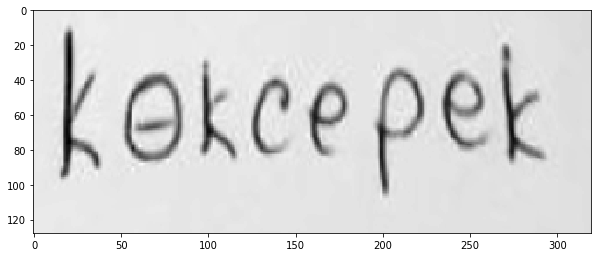

Көксерек


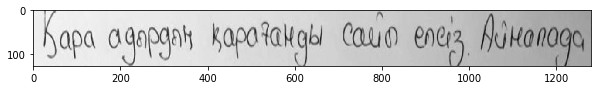

Қара адырдың қарағанды сайы елсіз. Айналада


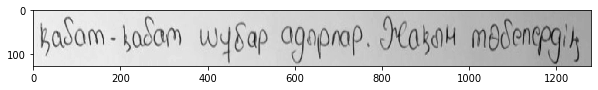

қабатқабат шұбар адырлар. Жақын төбелердің


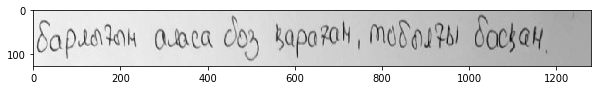

барлығын аласа боз қараған, тобылғы басқан.


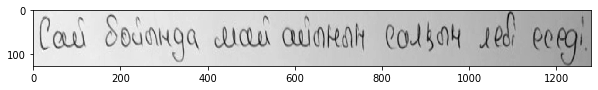

Сай бойында май айынын салқын лебі еседі.


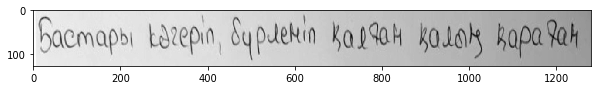

Бастары көгеріп, бүрленіп қалған қалың қараған


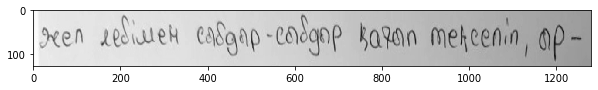

жел лебімен сыбдырсыбдыр қағып теңселіп, ыр


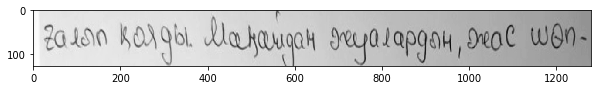

ғалып қалды. Маңайдан жуалардын, жас шөп


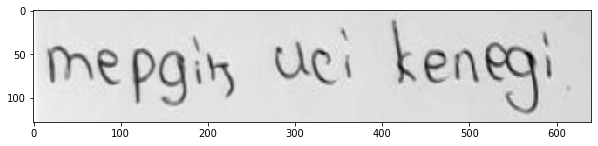

тердің исі келеді.


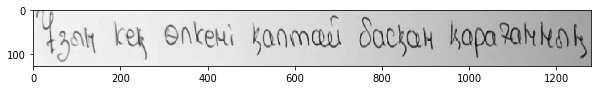

Ұзын кең өлкені қаптай басқан қарағанның


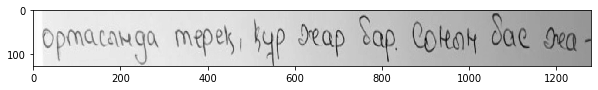

ортасында терек, құр жар бар. Соның бас жа


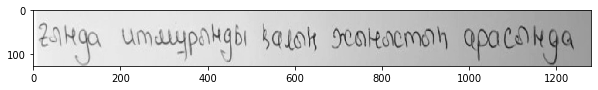

ғында итмұрынды қалын жыныстын арасында


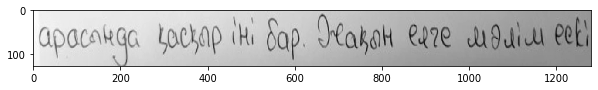

арасында қасқыр іні бар. Жақын елге мәлім ескі


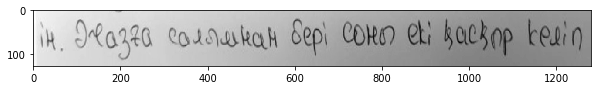

ін. Жазға салымнан бері соны екі қасқыр келіп


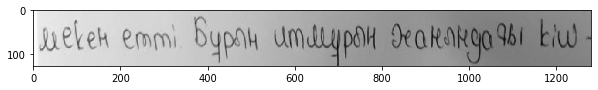

мекен етті. Бұрын итмұрын жанындағы кіш


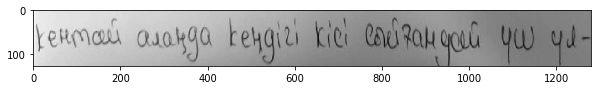

кентай алаңда кеңдігі кісі сығандай үш үл


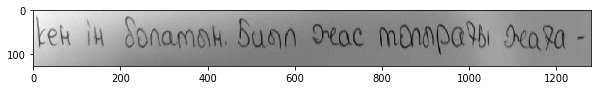

кен ін болатын. Биыл жас топырағы жаға


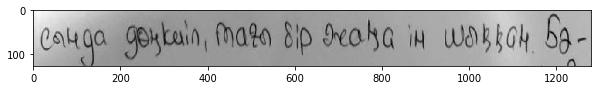

сында дөңкиіп, тағы бір жаңа ін шыққан. Бә


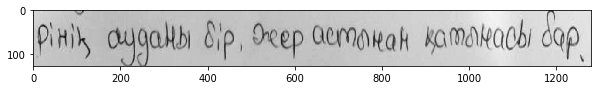

рінің ауданы бір. Жер астынан қатынасы бар.


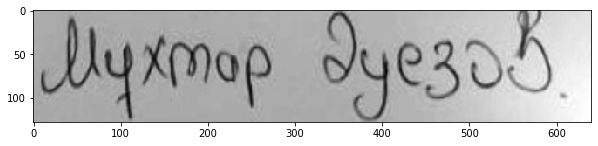

Мұхтар Әуезов.


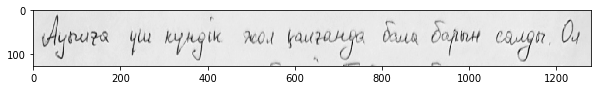

Ауылға үш күндік жол қалғанда бала шәкірт барын салды. Ол


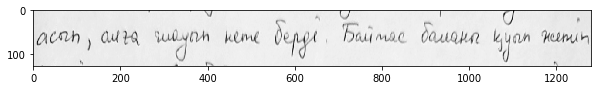

асып, алға шауып кете берді. Байтас баланы қуып жетіп


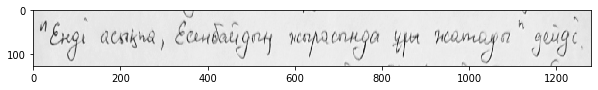

"Енді асықпа, Есенбайдың жырасында ұры жатады" дейді.


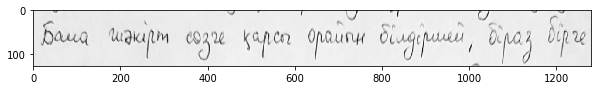

Бала шәкірт сөзге қарсы орайын білдірмей, біраз бірге


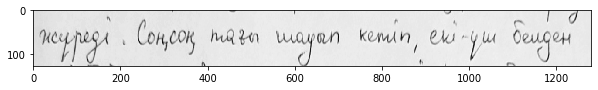

жүреді. Соңсоң тағы шауып кетіп, екіүш белден


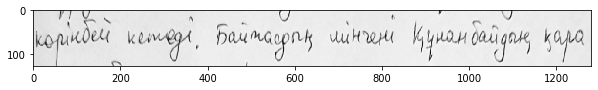

көрінбей кетеді. Байтасдың мінгені Құнанбайдың қара


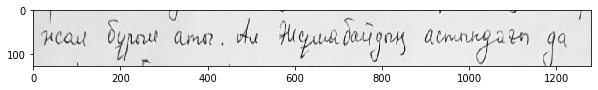

жал бұрыл аты. Ал Жұмабайдың астындағы да


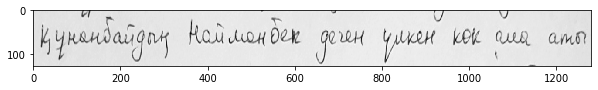

Құнанбайдың Найманбек деген үлкен көк ала аты


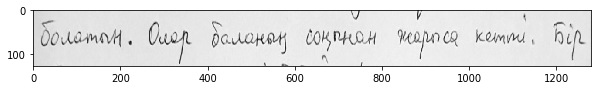

болатын. Олар баланың соңынан жарыса кетті. Бір


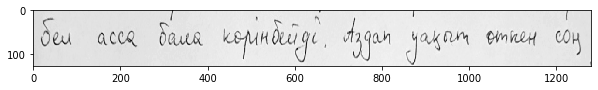

бел асса бала көрінбейді. Аздап уақыт өткен соң


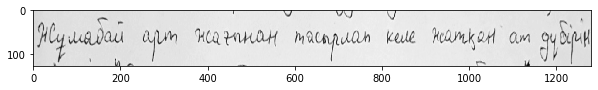

Жұмабай арт жағынан тасырлап келе жатқан ат дүбірін


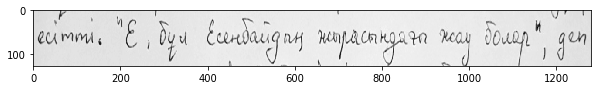

есітті. "Е, бұл Есенбайдың жырасындағы жау болар", деп


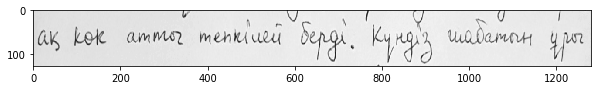

ақ көк атты тепкілей берді. Күндіз шабатын ұры


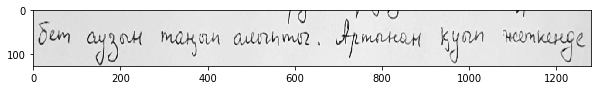

бет аузын таңып алыпты. Артынан қуып жеткенде


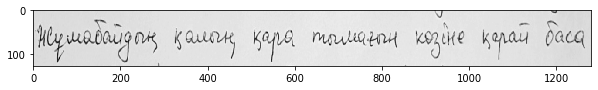

Жұмабайдың қалың қара тымағын көзіне қарай баса


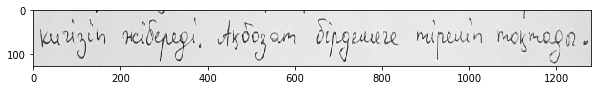

кигізіп жібереді. Ақбозат бірдемеге тіреліп тоқтады.


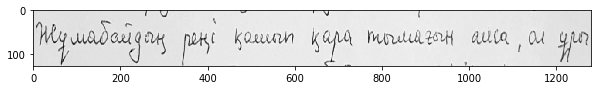

Жұмабайдың реңі қашып қара тымағын алса, ол ұры


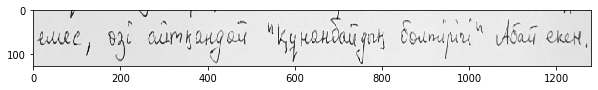

емес, өзі айтқандай "Құнанбайдың бөлтірігі" Абай екен.


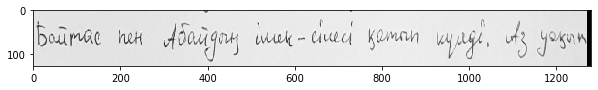

Байтас пен Абайдың ішексілесі қатып күлді. Аз уақыт


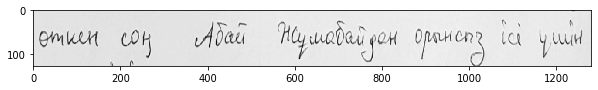

өткен соң Абай Жұмабайдан орынсыз ісі үшін


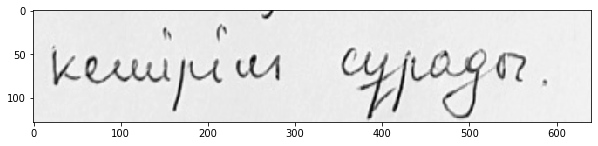

кешірім сұрады.


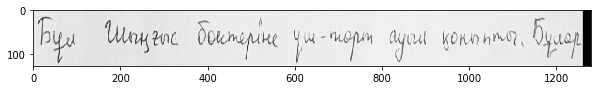

Бұл Шыңғыс бөктеріне үштөрт ауыл қоныпты. Бұлар


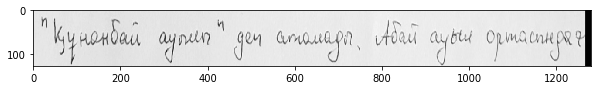

"Құнанбай ауылы" деп аталады. Абай ауыл ортасындағ


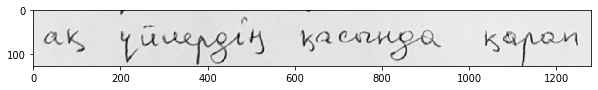

ақ үйлердің қасында қарап


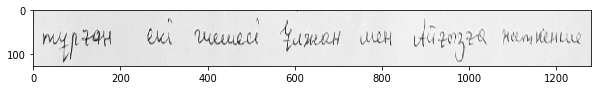

тұрған екі шешесі Ұлжан мен Айғызға жеткенше


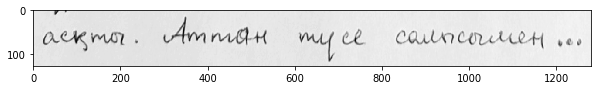

асқты. Аттан түсе салысымен...


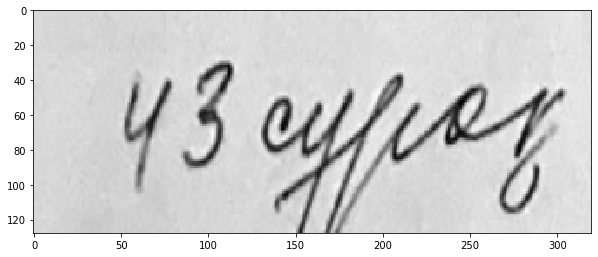

43 сұрақ


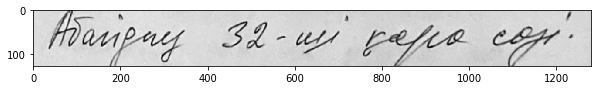

Абайдың 32ші қара сөзі.


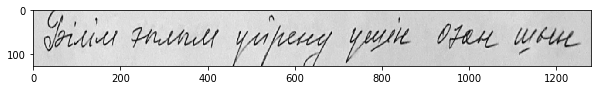

Білім ғылым үйрену үшін оған шын


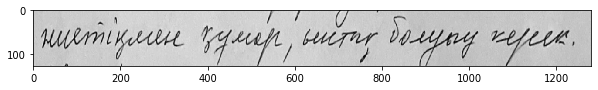

ниетіңмен құмар, ынтық болуың керек.


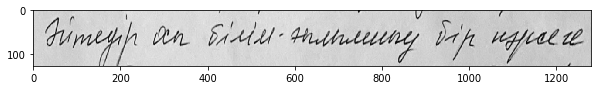

Әйтеуір осы білімғылымның бір нәрсеге


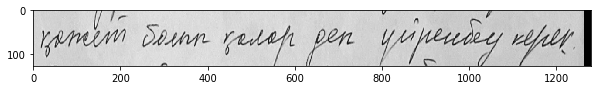

қажет болып қалар деп үйренбеу керек.


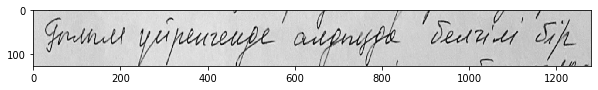

Ғылым үйренгенде алдыңда белгілі бір


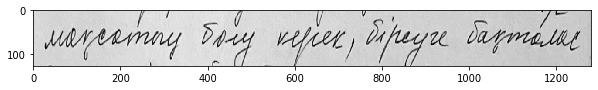

мақсатың болу керек, біреуге бақталас


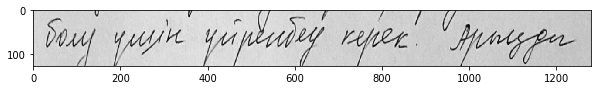

болу үшін үйренбеу керек. Арыңды


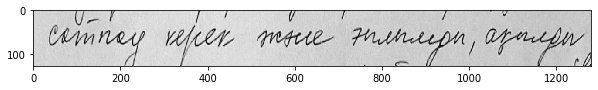

сатпау керек және ғылымды, ақылды


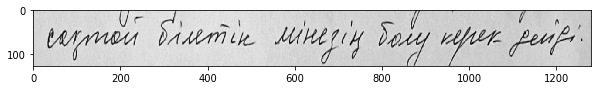

сақтай білетін мінезің болу керек дейді.


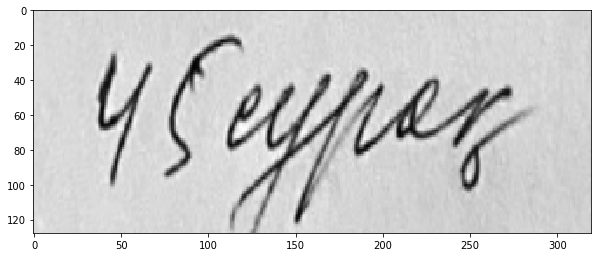

45 сұрақ


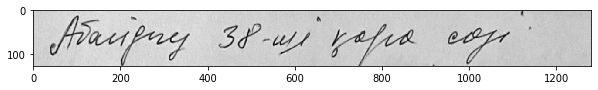

Абайдың 38ші қара сөзі


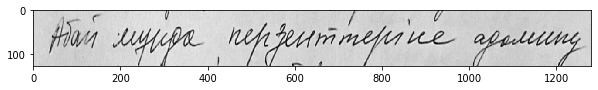

Абай мұнда перзенттеріне адамның


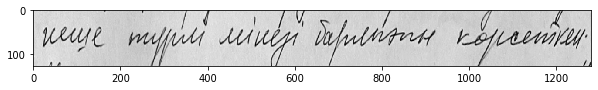

неше түрлі мінезі барлығын көрсеткен.


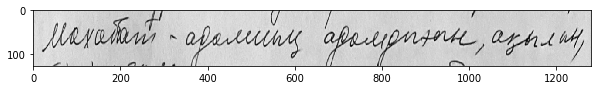

Махаббат  адамның адамдығын, ақылын,


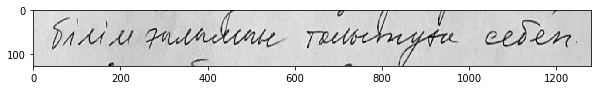

білім ғылымын толытуға себеп.


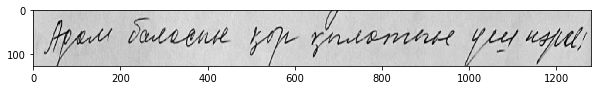

Адам баласын қор қылатын үш нәрсе:


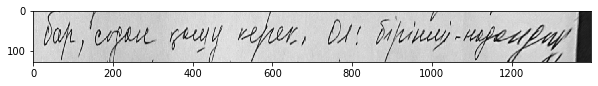

бар, содан қашу керек. Ол: біріншінадандық,


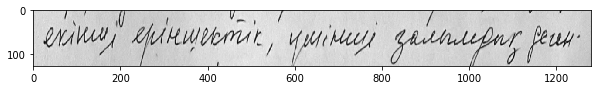

екінші еріншектік, үшінші залымдық деген.


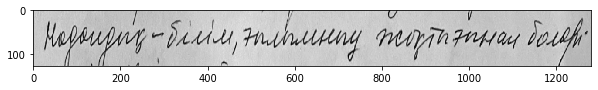

Надандықбілім, ғылымның жоқтығынан болар.


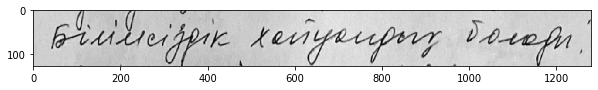

Білімсіздік хайуандылық болады.


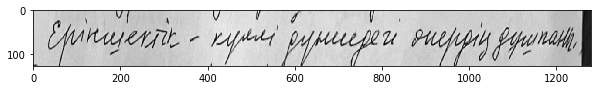

Еріншектіккүллі дүниедегі өнердің дұшпаны.


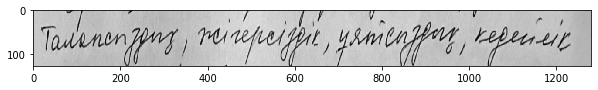

Талапсыздық,жігерсіздік,ұятсыздық,кедейлік


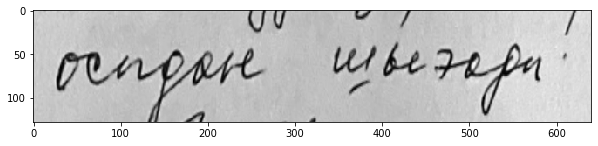

осыдан шығады.


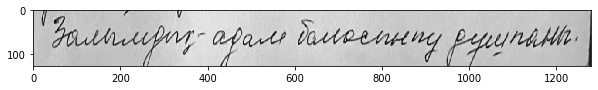

Залымдықадам баласының дұшпаны.


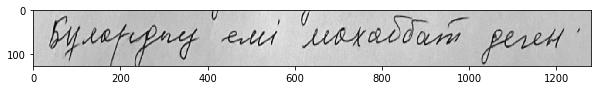

Бұлардың емі махаббат деген.


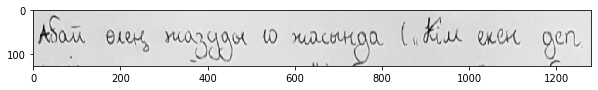

Абай өлең жазуды 10 жасында ("Кім екен деп


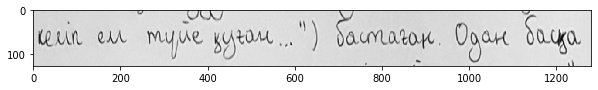

келіп ем түйе қуған...") бастаған. Одан басқа


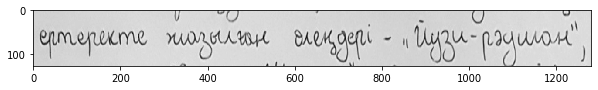

ертеректе жазылған өлеңдері  "Йузирәушан",


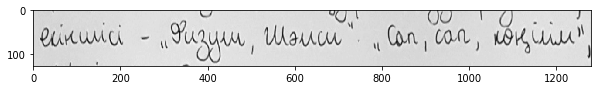

екіншісі  "Физули, Шәмси". "Сап, сап, көңілім",


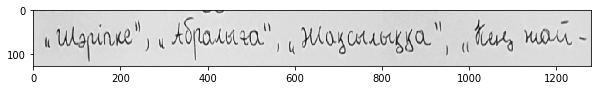

"Шәріпке", "Абралыға", "Жақсылыққа", "Кең жай


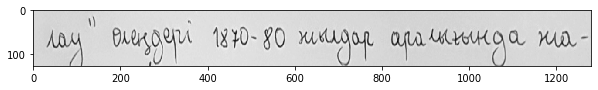

лау" өлеңдері 187080 жылдар аралығында жа


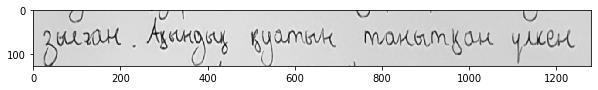

зылған. Ақындық қуатын танытқан үлкен


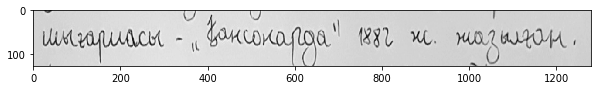

шығармасы  "Қансонарда" 1882 ж. жазылған.


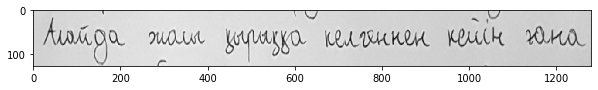

Алайда жасы қырыққа келгеннен кейін ғана


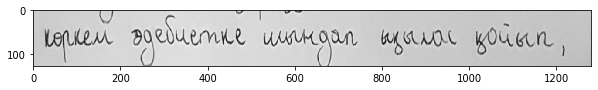

көркем әдебиетке шындап ықылас қойып,


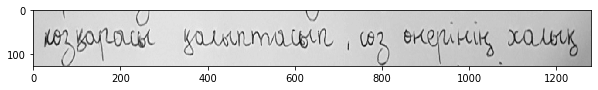

көзқарасы қалыптасып, сөз өнерінің халық


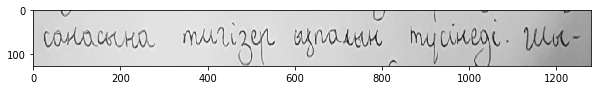

санасына тигізер ықпалын түсінеді. Шы


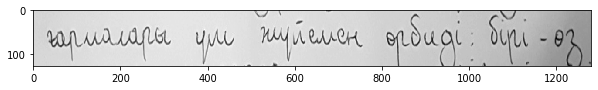

ғармалары үш жүйемен өрбиді: бірі  өз


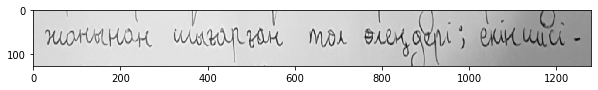

жанынан шығарған төл өлеңдері; екіншісі 


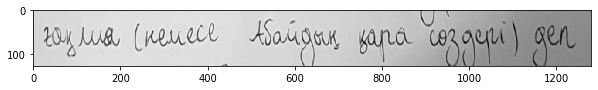

ғақлия (немесе Абайдың қара сөздері) деп


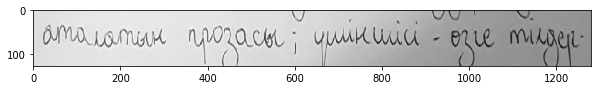

аталатын прозасы; үшіншісі  өзге тілдер


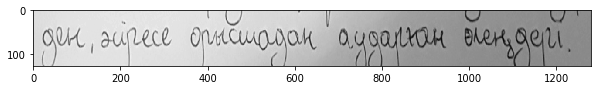

ден, әсіресе орысшадан аударған өлеңдері.


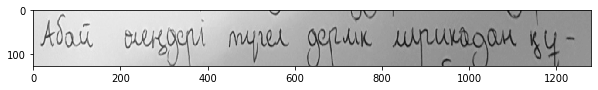

Абай өлеңдері түгел дерлік лирикадан құ


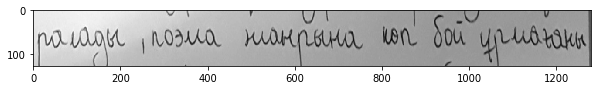

ралады, поэма жанрына көп бой ұрмағаны


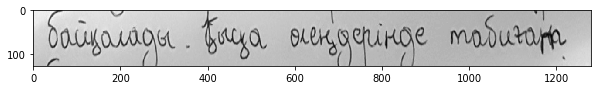

байқалады. Қысқа өлеңдерінде табиғат


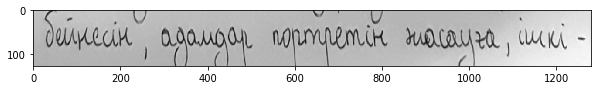

бейнесін, адамдар портретін жасауға, ішкі 


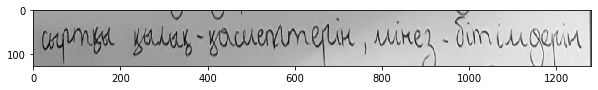

сыртқы қыдыққассиеттерін, мінезбітімдерін


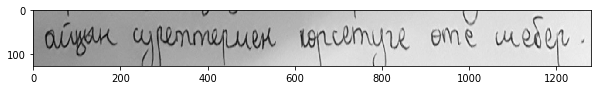

айқын суреттермен көрсетуге өте шебер.


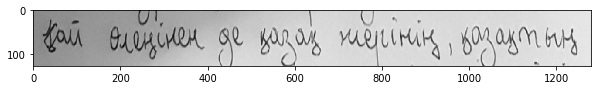

Қай өлеңінен де қазақ жерінің, қазақтың


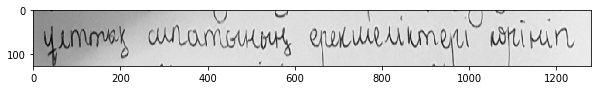

ұлттық сипатының ерекшеліктері көрініп


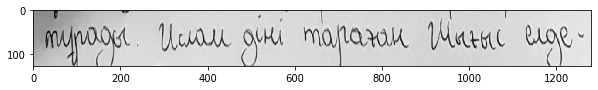

тұрады. Ислам діні тараған Шығыс елде


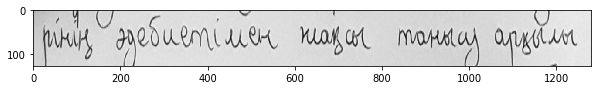

рінің әдебиетімен жақсы танысу арқылы


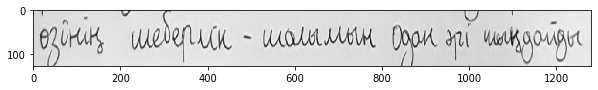

өзінің шеберлік  шалымын одан әрі шыңдайды


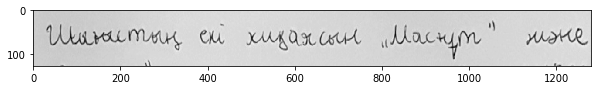

Шығыстың екі хиқаясын "Масғұт" және


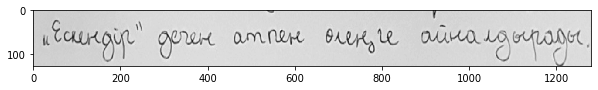

"Ескендір" деген атпен өлеңге айналдырады.


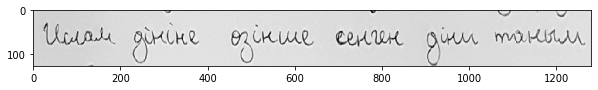

Ислам дініне өзінше сенген діни таным


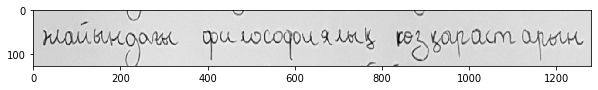

жайындағы философиялық көзқарастарын


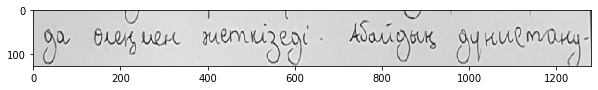

да өлеңмен жеткізеді. Абайдың дүниетану


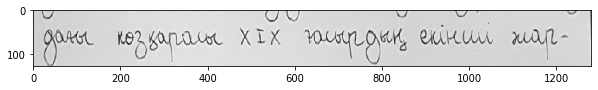

дағы көзқарасы XIX ғасырдың екінші жар


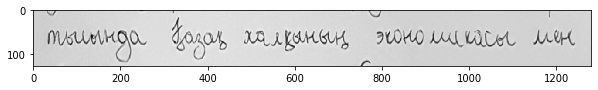

тысында Қазақ халқының экономикасы мен


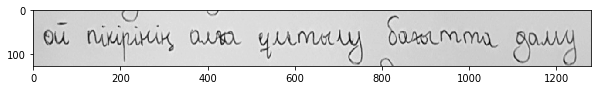

ой пікірінің алға ұмтылу бағытта даму


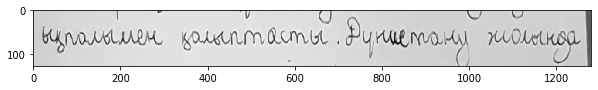

ықпалымен қалыптасты. Дүниетану жолында


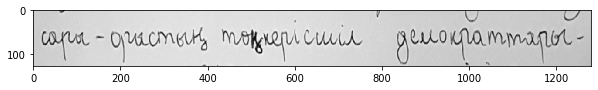

сарыорыстың төңкерісшіл демократтары


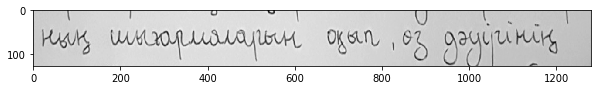

ның шығармаларын оқып, өз дәуірінің


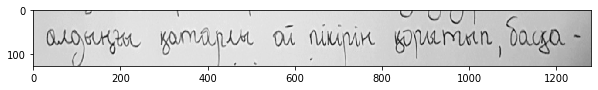

алдыңғы қатарлы ой пікірін қорытып, басқа


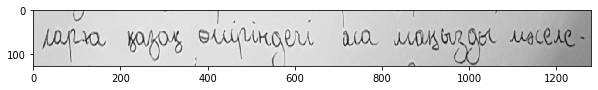

ларға қазақ өміріндегі аса маңызды мәселе


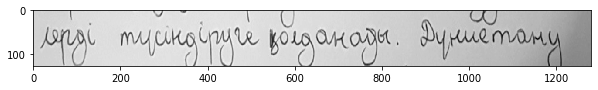

лерді түсіндіруге қолданады. Дүниетану


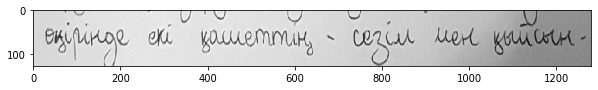

өңірінде екі қасиеттің  сезім мен қыйсын


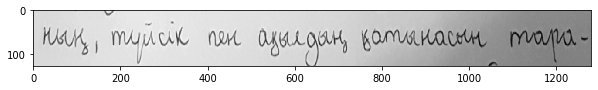

ның, түйсік пен ақылдың қатынасын тара


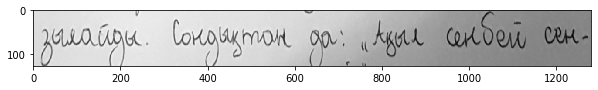

зылайды. Сондықтан да: "Ақыл сенбей сен


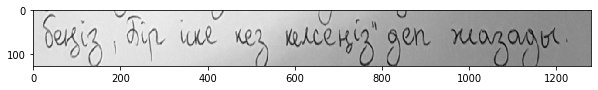

беңіз, Бір іске кез келсеңіз" деп жазады.


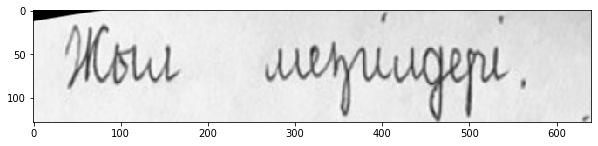

Жыл мезгілдері


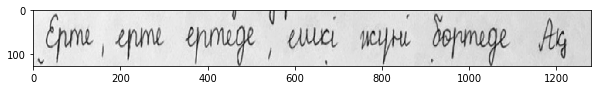

Ерте, ерте ертеде, ешкі жүні бөртеде Ақ


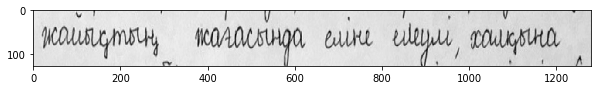

жайықтың жағасында еліне елеулі, халқына


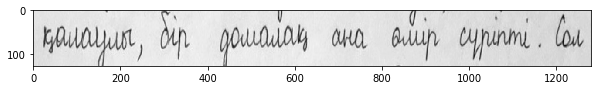

қалаулы, бір домалақ ана өмір сүріпті. Сол


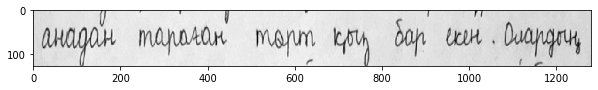

анадан тараған төрт қыз бар екен. Олардың


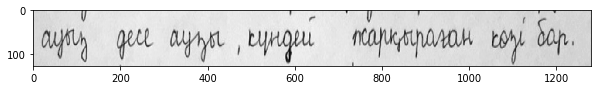

ауыз десе аузы, күндей жарқыраған көзі бар.


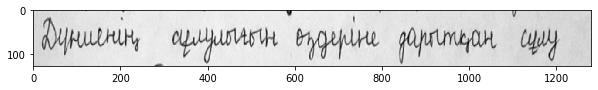

Дүниенің сұлулығын өздеріне дарытқан сұлу


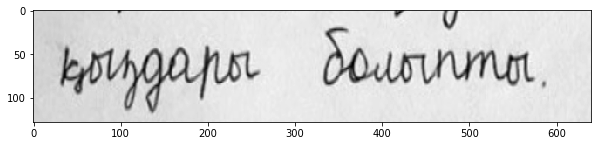

қыздары болыпты.


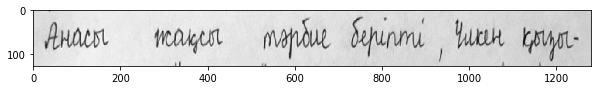

Анасы жақсы тәрбие беріпті, Үлкен қызы


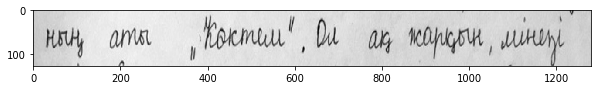

ның аты "Көктем". Ол ақ жарқын, мінезі


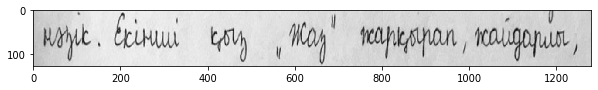

нәзік. Екінші қыз "Жаз" жарқырап, жайдарлы,


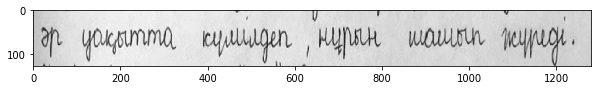

әр уақытта күлімдеп, нұрын шашып жүреді.


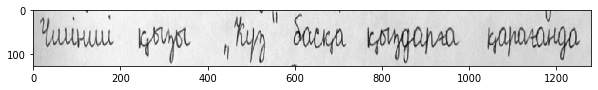

Үшінші қызы "Күз" басқа қыздарға қарағанда


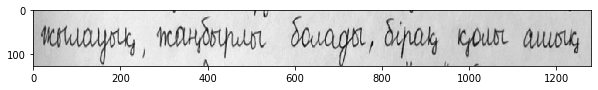

жылауық, жаңбырлы болады, бірақ қолы ашық


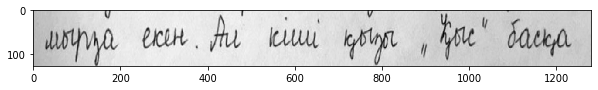

мырза екен. Ал кіші қызы "Қыс" басқа


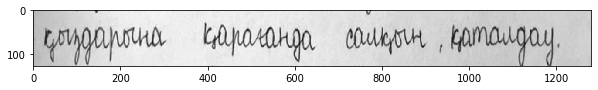

қыздарына қарағанда салқын, қаталдау.


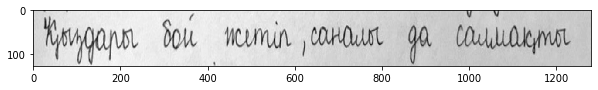

Қыздары бой жетіп, саналы да салмақты


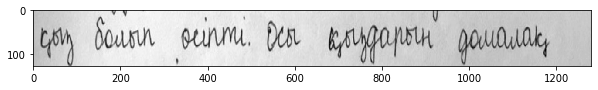

қыз болып өсіпті. Осы қыздарын домалақ


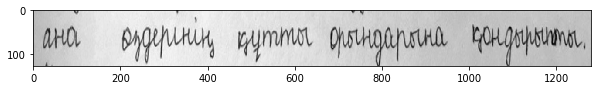

ана өздерінің құтты орындарына қондырыпты.


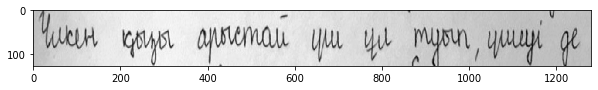

Үлкен қызы арыстай үш ұл туып, үшеуі де


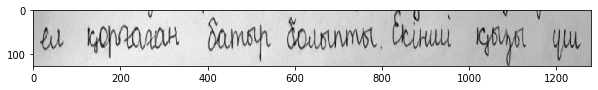

ел қорғаған батыр болыпты. Екінші қызы үш


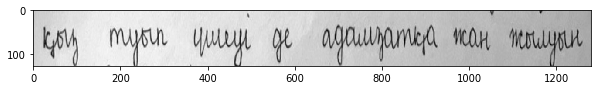

қыз туып үшеуі де адамзатқа жан жылуын


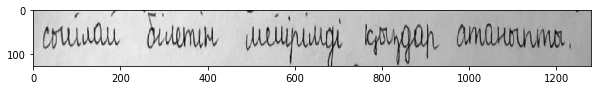

сыйлай білетін мейірімді қыздар атаныпты.


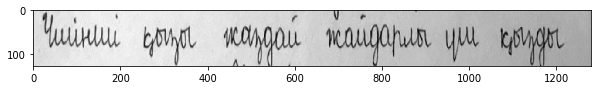

Үшінші қызы жаздай жайдарлы үш қызды


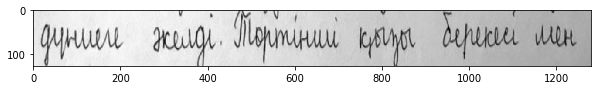

дүниеге әкелді. Төртінші қызы берекесі мен


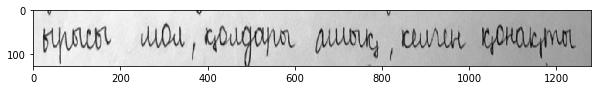

ырысы мол, қолдары ашық, келген қонақты


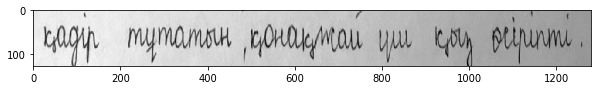

қадір тұтатын, қонақжай үш қыз өсіріпті.


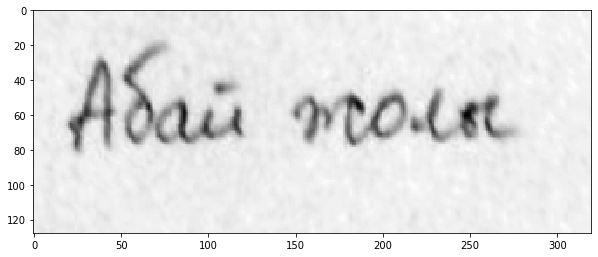

Абай жолы


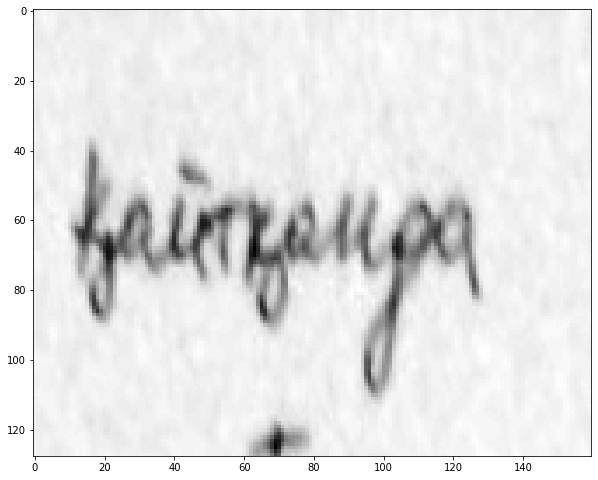

қайтқанда


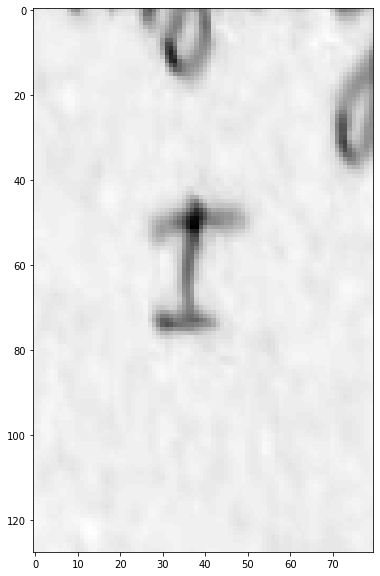

I


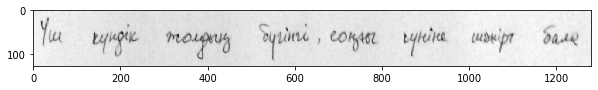

Үш күндік жолдың бүгінгі, соңғы күніне шәкірт бала


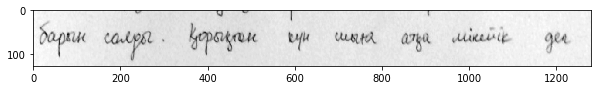

барын салды. Қорықтан күн шыға атқа мінейік деп


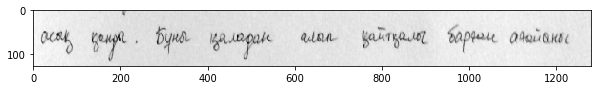

асыққанды. Бұны қаладан алып қайтқалы барған ағайыны


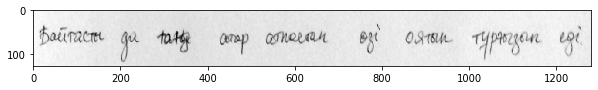

Байтасты да таң атаратпаста оятып тұрғызып еді.


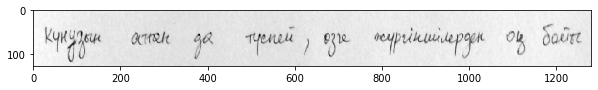

Күнұзын аттан да түспей, өзге жүргіншілерден оқ бойы


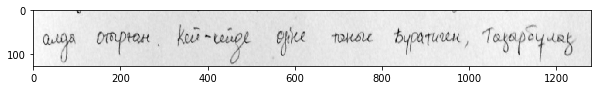

алда отырған. Кейкейде өзіне таныс Көкүйірім мен Буратиген, Тақырбұлақ


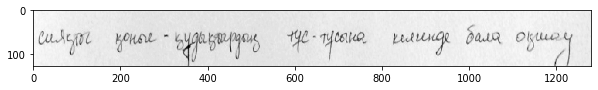

сияқты қонысқұдықтардың тұстұсына келгенде бала оқшау


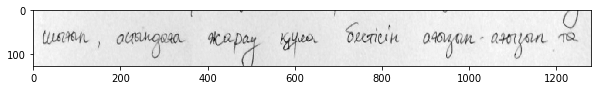

шығып, астындағы жарау құла бестісін ағызыпағызып та


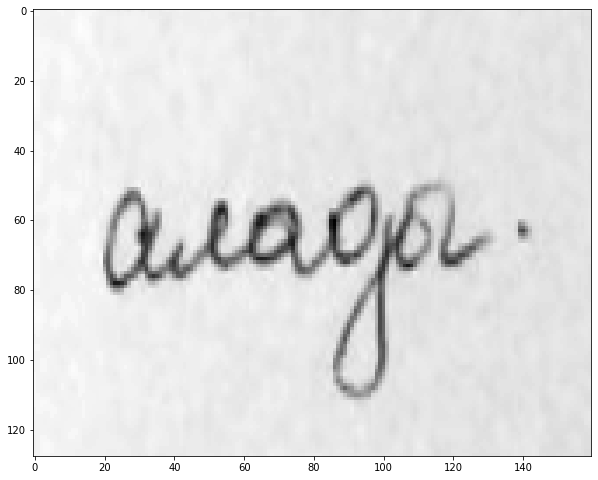

алады.


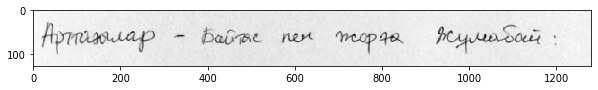

Арттағылар  Байтас пен жорға Жұмабай:


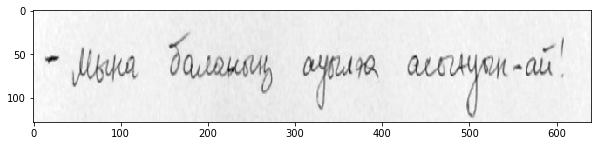

 Мына баланың ауылға асығуынай!


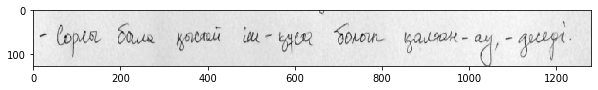

 Сорлы бала қыстай іш құста болып қалғанау, деседі.


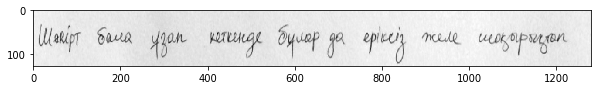

Шәкірт бала ұзап кеткенде бұлар да еріксіз желе шоқырақтап


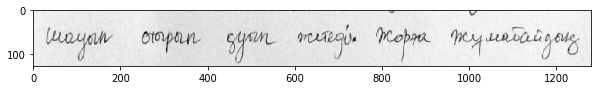

шауып отырып қуып жетеді. Жорға Жұмабайдың


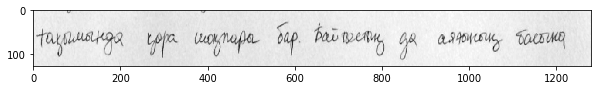

тақымында қара шоқпары бар. Байтастың да аяғының басына


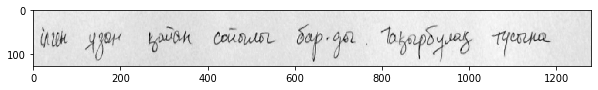

ілген ұзын қайың сойылы барды. Тақырбұлақ тұсына


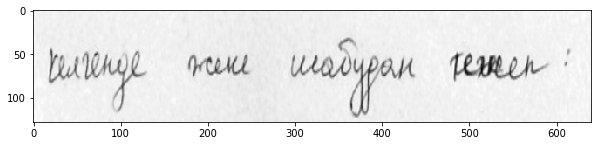

келгенде Байтастар баланы жеке шабудан тежеп:


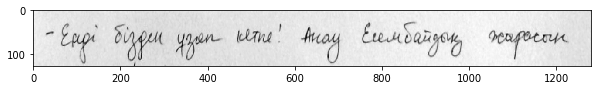

 Енді бізден ұзап кетпе! Анау Есембайдың жырасын


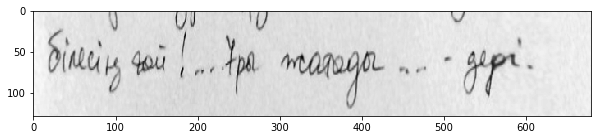

білесің ғой!... Ұры жатады...  деді.


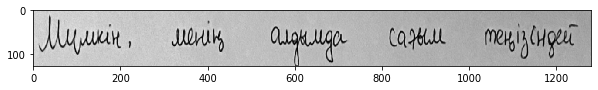

Мүмкін, менің алдымда сағым теңізіндей


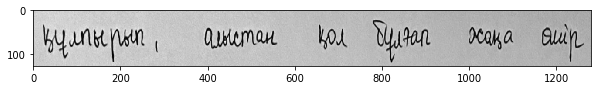

құлпырып, алыстан қол бұлғап жаңа өмір


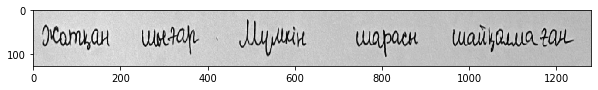

жатқан шығар. Мүмкін шарасы шайқалмаған


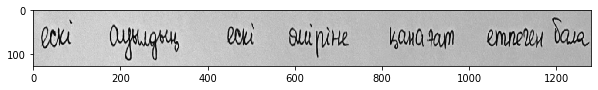

ескі ауылдың ескі өміріне қанағат етпеген бала


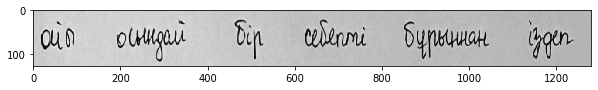

ойы осындай бір себепті бұрыннан іздеп


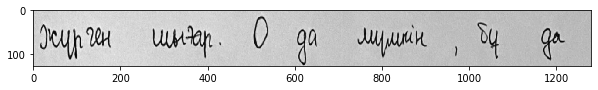

жүрген шығар. О да мүмкін, бұ да


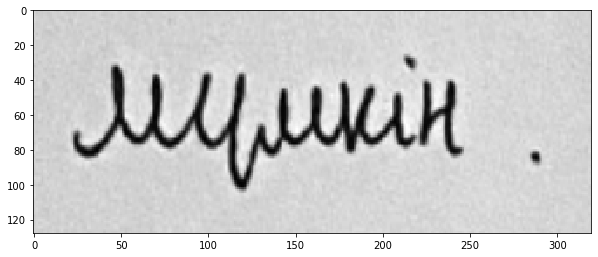

мүмкін.


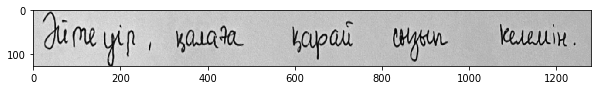

Əйтеуір, қалаға қарай сызып келемін.


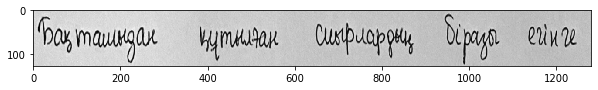

Бақташыдан құтылған сиырлардың біразы егінге


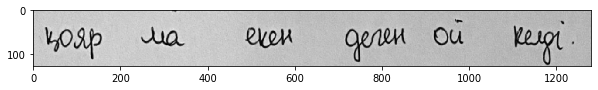

қояр ма екен деген ой келеді.


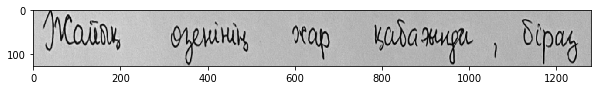

Жайық өзенінің жар қабағында, біраз


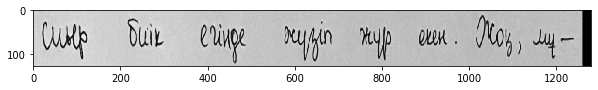

сиыр биік егінде жүзіп жүр екен. Жоқ, мұ


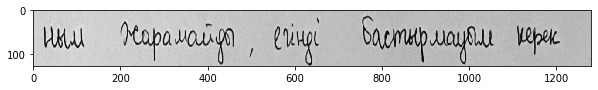

ным жарамайды, егінді бастырмауым керек


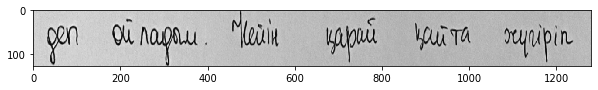

деп ойладым. Кейін қарай қайта жүгіріп


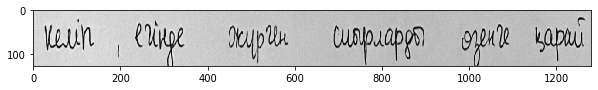

келіп, егінде жүрген сиырларды өзенге қарай


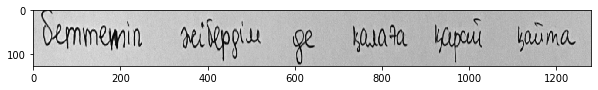

беттетіп жібердім де қалаға қарай қайта


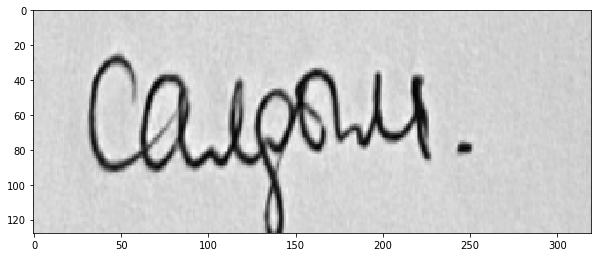

салдым.


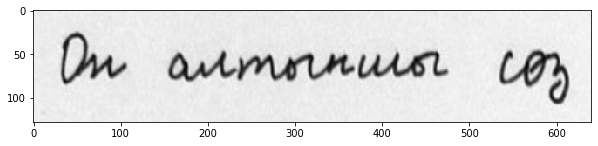

Он алтыншы сөз


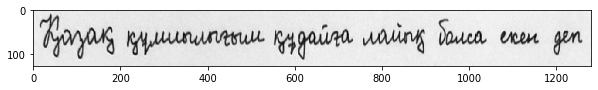

Қазақ құлшылығым құдайға лайық болса екен деп


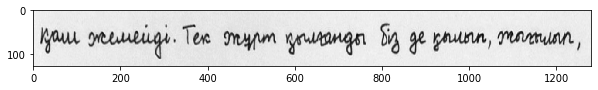

қам жемейді. Тек жұрт қылғанды біз де қылып, жығылып,


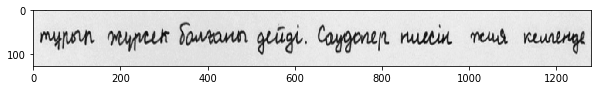

тұрып жүрсек болғаны дейді. Саудагер ниесін жия келгенде


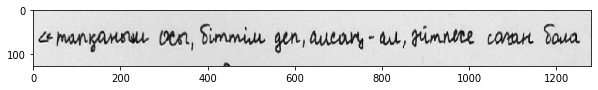

«тапқаным осы, біттім деп, алсаңал, әйтпесе саған бола


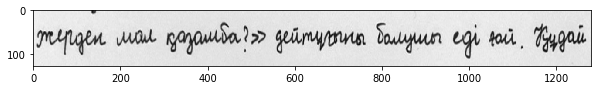

жерден мал қазамба?» дейтұғыны болушы еді ғой. Құдай


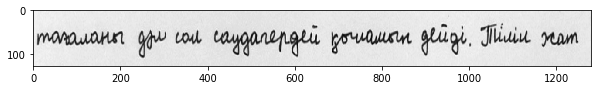

тағаланы дәл сол саудагердей қыламын дейді. Тілін жат


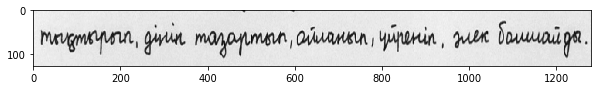

тықтырып, дінін тазартып, ойланып, үйреніп әлек болмайды.


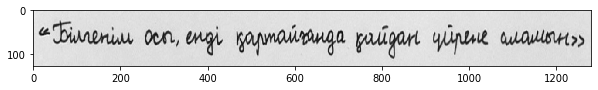

«Білгенім осы, енді қартайғанда қайдан үйрене аламын»


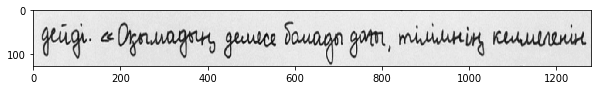

дейді. «Оқымадың демесе болады дағы, тілімнің келмегенін


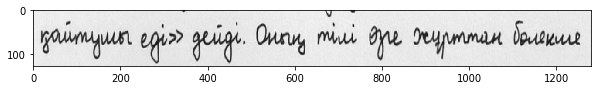

қайтушы еді» дейді. Оның тілі өзге жұрттан бөлекше


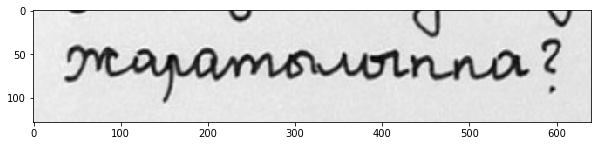

жаратылыппа?


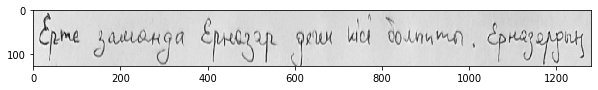

Ерте заманда Ерназар деген кісі болыпты. Ерназардың


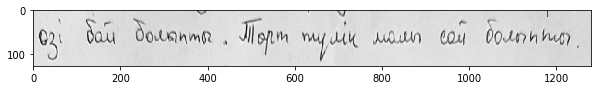

өзі бай болыпты. Төрт түлік малы сай болыпты.


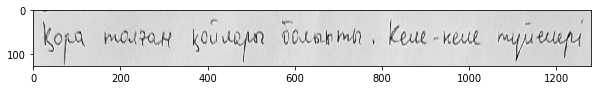

Қора толған қойлары болыыты. Келекеле түйелері


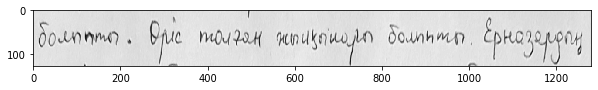

болыпты. Өріс толған жылқылары болыпты. Ерназардың


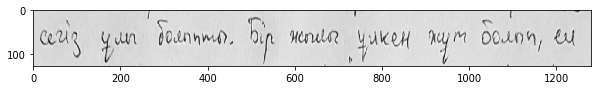

сегіз ұлы болыпты. Бір жылы ұлкен жұт болып, ел


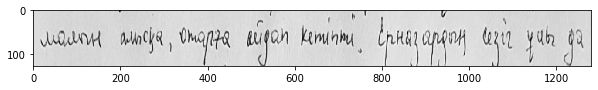

малын алысқа, отарға айдап кетіпті. Ерназардың сегіз ұлы да


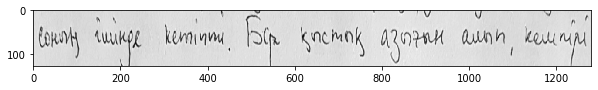

соның ішінде кетіпті. Бір қыстық азығын алып, кемпірі


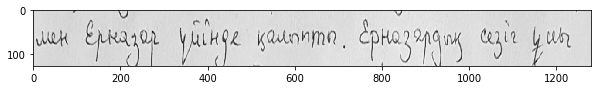

мен Ерназар үйінде қалыпты. Ерназардың сегіз ұлы


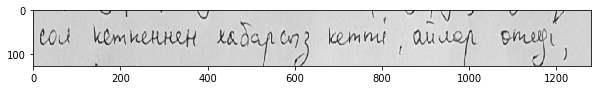

сол кеткеннен хабарсыз кетті, айлар өтеді,


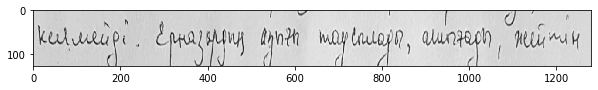

келмейді. Ерназардың азығы таусылады, ашығады, жейтін


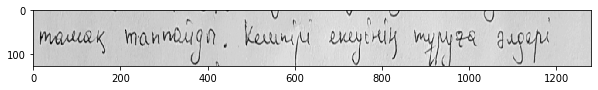

тамақ таппайды. Кемпірі екеуінің тұруға әлдері


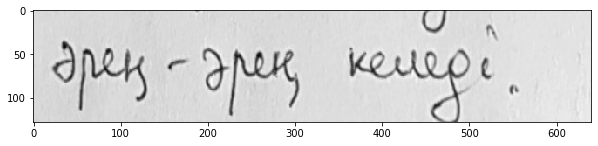

әреңәрең келеді.


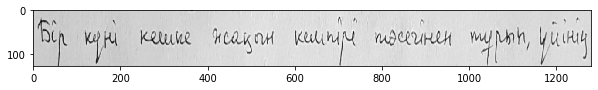

Бір күні кешке жақын кемпірі төсегінен тұрып, үйінің


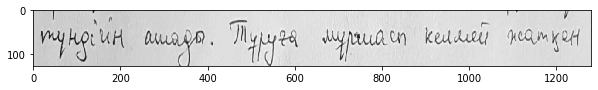

түндігін ашады. Тұруға мұршасы келмей жатқан


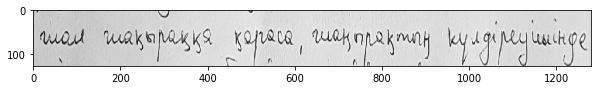

шал шаңыраққа қараса, шаңырақтың күлдіреуішінде


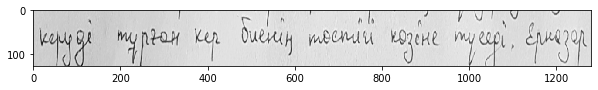

керуді тұрған кер биенің төстігі көзіне түседі. Ерназар


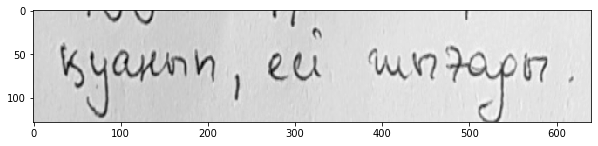

қуанып, есі шығады.


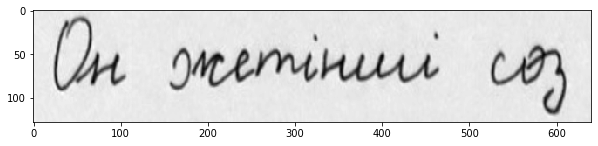

Он жетінші сөз


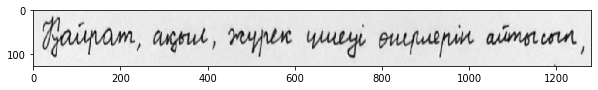

Қайрат, ақыл, жүрек үшеуі өнерлерін айтысып,


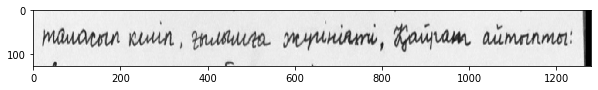

таласып келіп, ғылымға жүгініпті. Қайрат айтыпты:


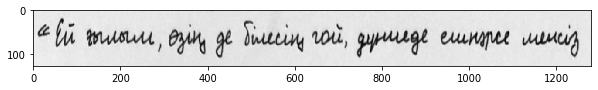

«Ей, ғылым, өзің де білесің ғой, дүниеде ешнәрсе менсіз


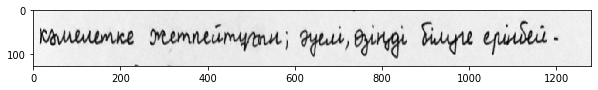

кәмелетке жетпейтұғынын; әуелі, өзіңді білуге ерінбей


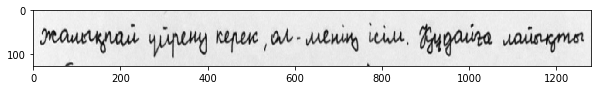

жалықпай үйрену керек, ол  менің ісім. Құдайға лайықты


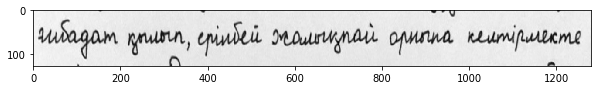

ғибадат қылып, ерінбей жалықпай орнына келтірмекте


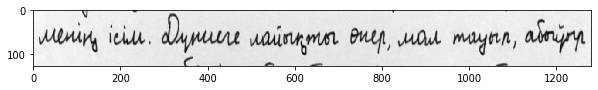

менің ісім. Дүниеге лайықты өнер, мал тауып, абыұйыр


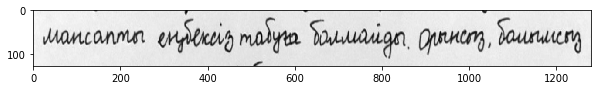

мансапты еңбексіз табуға болмайды. Орынсыз, болымсыз


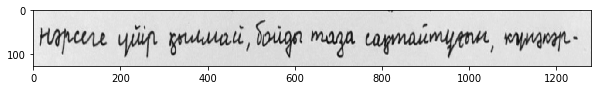

нәрсеге үйір қылмай, бойды таза сақтайтұғын, күнәкәр


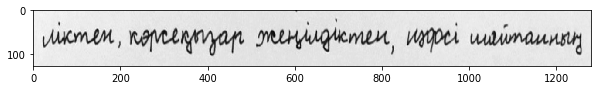

ліктен, көрсеқызар жеңілдіктен, нәфсі шайтанның


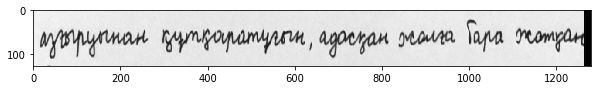

азғыруынан құтқаратұғын, адасқан жолға бара жатқан


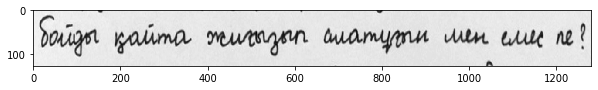

бойды қайта жиғызып алатұғын мен емес пе?


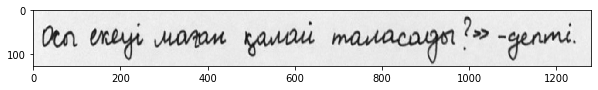

Осы екеуі маған қалай таласады?» депті.


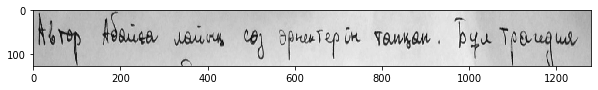

Автор Абайға лайық сөз өрнектерін тапқан. Бұл трагедия


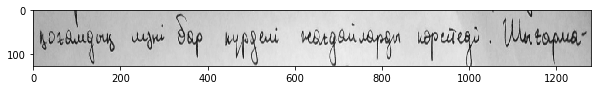

қоғамдық мәні бар күрделі жағдайларды көрсетеді. Шығарма


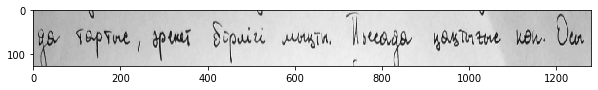

да тартыс, әрекет бірлігі мықты. Пьесада қақтығыс көп. Осы


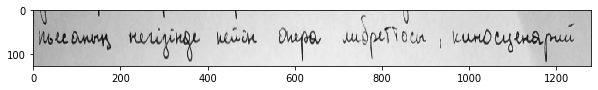

пьесаның негізінде кейін опера либреттосы, киносценарий


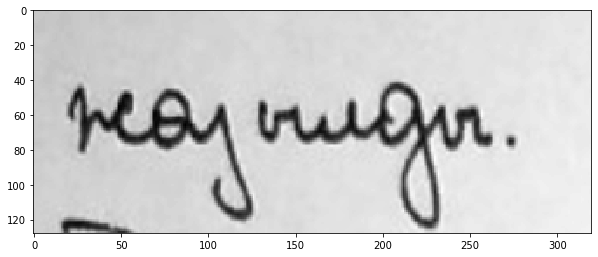

жазылды.


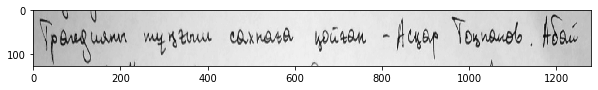

Трагедияны тұңғыш сахнаға қойған  Асқар Тоқпанов. Абай


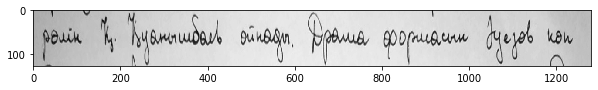

рөлін Қ. Қуанышбаев ойнады. Драма формасын Әуезов көп


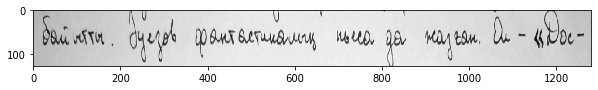

байытты. Әуезов фантастикалық пьеса да жазған. Ол  «Дос 


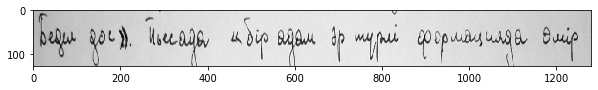

Бедел дос». Пьесада «бір адам әр түрлі формацияда өмір


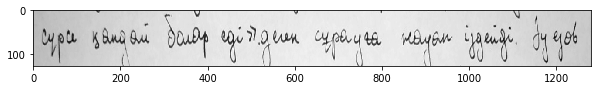

сүрсе қандай болар еді» деген сұрауға жауап іздейді. Әуезов


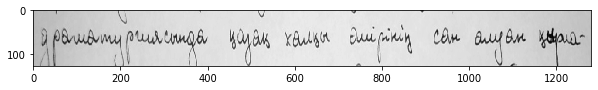

драматургиясында қазақ халқы өмірінің сан алуан қырла


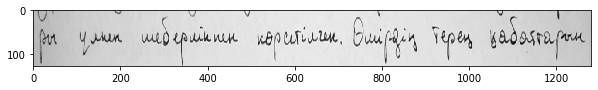

ры үлкен шеберлікпен көрсетілген. Өмірдің терең қабаттарын


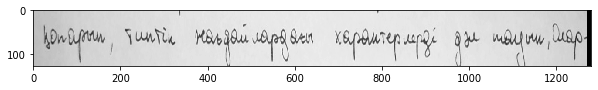

қопарып, типтік жағдайлардағы характерлерді дәл тауып, олар


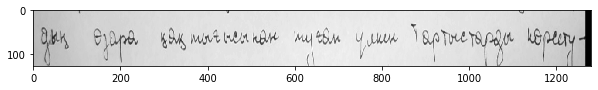

дың өзара қақтығысынан туған үлкен тартыстарды көрсету 


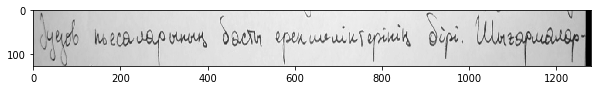

Әуезов пьесаларының басты ерекшеліктерінің бірі. Шығармалар


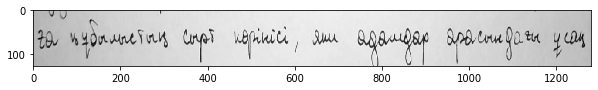

ға құбылыстың сырт көрінісі, яки адамдар арасындағы ұсақ


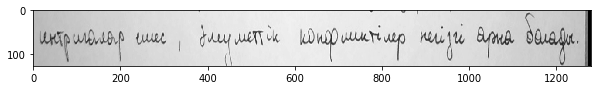

интригалар емес, әлеуметтік конфликтілер негізгі арна болады.


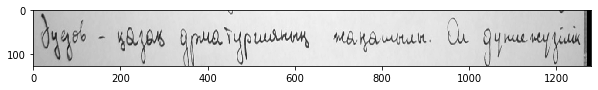

Әуезов  қазақ дрматургияның жаңашылы. Ол дүниежүзілік


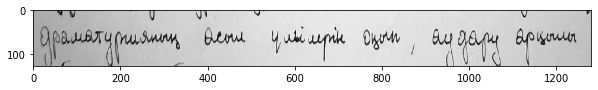

драматургияның асыл үлгілерін оқып, аудару арқылы


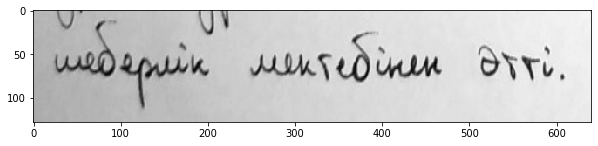

шеберлік мектебінен өтті.


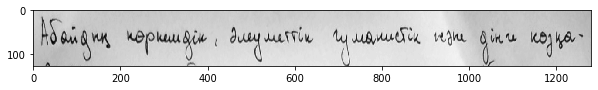

Абайдың көркемдік, әлеуметтік гуманистік және дінге көзқа


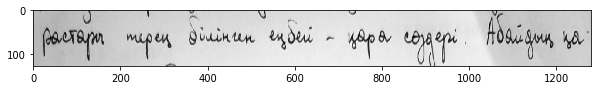

растары терең білінген еңбегі  қара сөздері. Абайдың қа


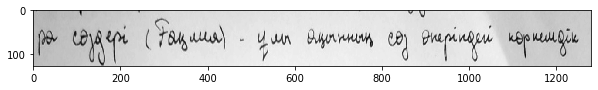

ра сөздері (Ғақлия)  ұлы ақынның сөз өнеріндегі көркемдік


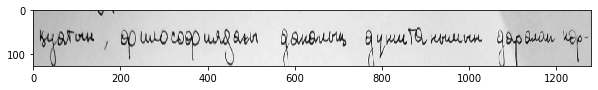

қуатын, философиядағы даналық дүниетанымын даралап көр


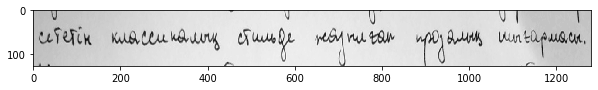

сететін классикалық стильде жазылған прозалық шығармасы.


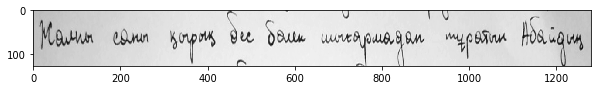

Жалпы саны қырық бес бөлек шығармадан тұратын Абайдың


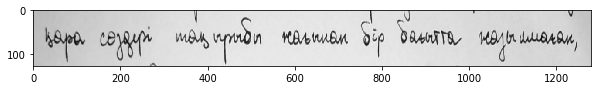

қара сөздері тақырыбы жағынан бір бағытта жазылмаған,


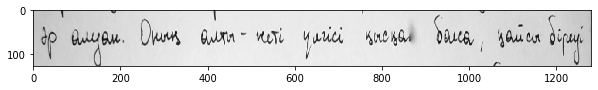

әр алуан. Оның алтыжеті үлгісі қысқа болса, қайсы біреуі


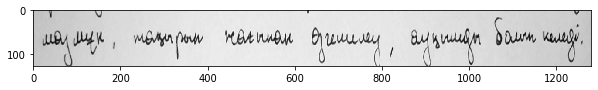

мазмұн, тақырып жағынан өзгешелеу, ауқымды болып келеді.


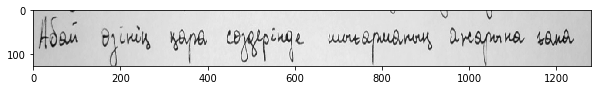

Абай өзінің қара сөздерінде шығарманың ажарына ғана


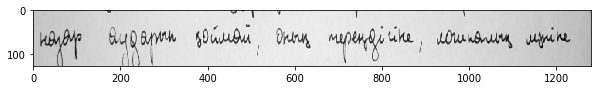

назар аударып қоймай, оның тереңдігіне, логикалық мәніне


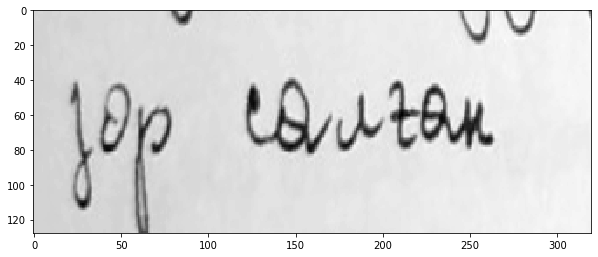

зор салған.


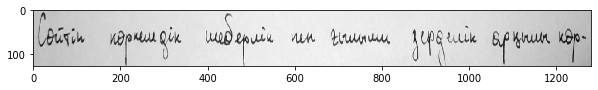

Сөйтіп көркемдік шеберлік пен ғылыми зерделік арқылы көр


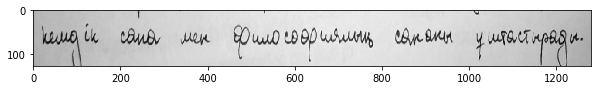

кемдік сана мен философиялық сананы ұштастырады.


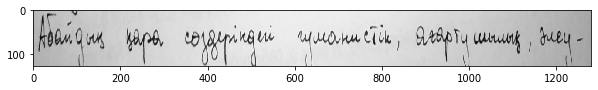

Абайдың қара сөздеріндегі гуманистік, ағартушылық, әлеу


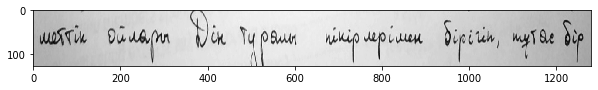

меттік ойлары Дін туралы пікірлерімен бірігіп, тұтас бір


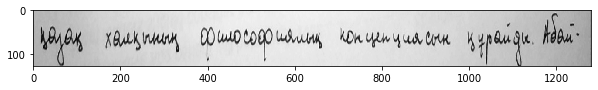

қазақ халқының философиялық концепциясын құрайды. Абай


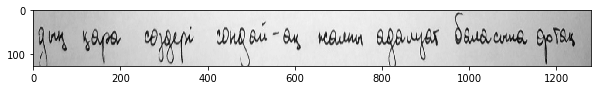

дың қара сөздері сондайақ жалпы адамзат баласына ортақ


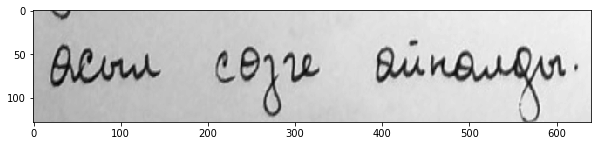

асыл сөзге айналды.


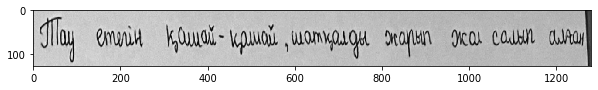

Тау етегін қашайқашай, шатқалды жарып жол салып алған


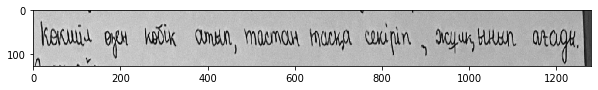

көкшіл өзен көбік атып, тастан тасқа секіріп, жұлқынып ағады.


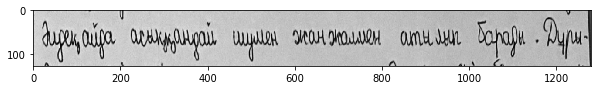

Əлдеқайда асыққандай шумен жанжалмен атылып барады. Дұры


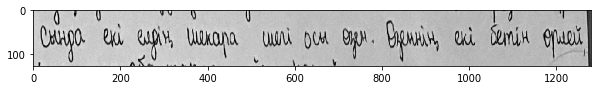

сында екі елдің шекара шегі осы өзен. Өзеннің екі бетін өрлей,


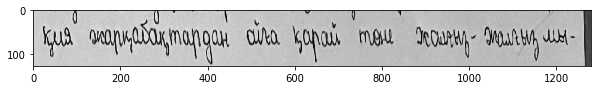

қия жарқабақтардан ойға қарай төне жалғызжалғыз мы


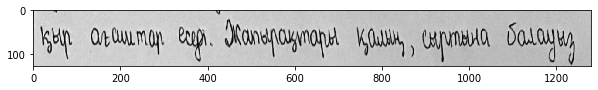

қыр ағаштар еседі. Жапырақтары қалың, сыртына балауыз


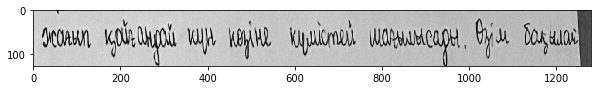

жағып қойғандай күн көзіне күмістей шағылысады. Өзім бақылай


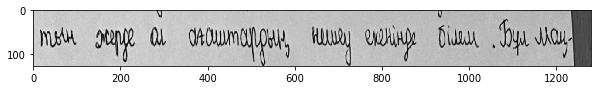

тын жерде ол ағаштардың нешеу екенінде білем. Бұл маң


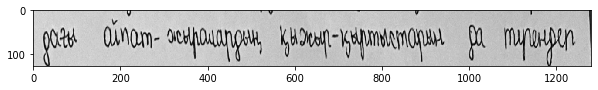

дағы ойпатжыралардың қыжырқыртыстарын да түгендеп


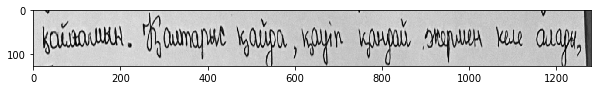

қойғамын. Қалтарыс қайда, қауіп қандай жермен келе алады,


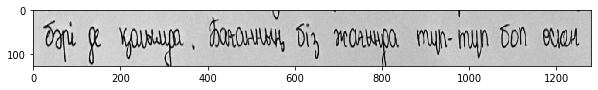

бəрі де қолымда. Бағанның біз жағында түптүп боп өскен


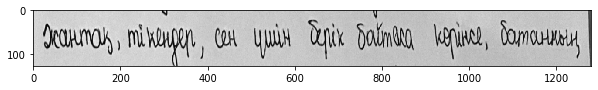

жантақ, тікендер, сен үшін берік бойтаса көрінсе, батанның


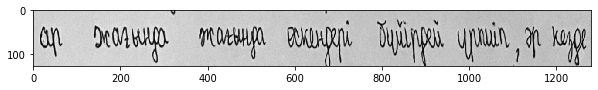

ар жағында жағында өскендері бүйірдей үрпиіп, əр кезде


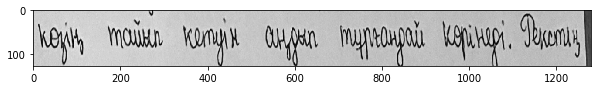

көзің тайып кетуін аңдып тұрғандай көрінеді. Рекстің


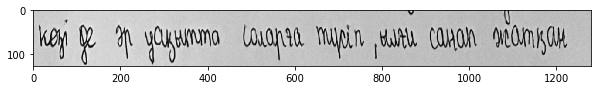

көзі де əр уақытта соларға түсіп, ылғи санап жатқан


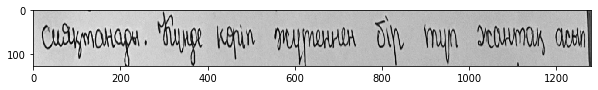

сияқтанады. Күнде көріп жүргеннен бір түп жантақ асып


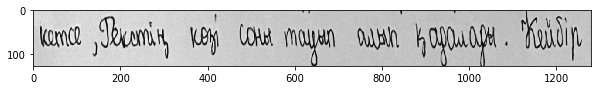

кетсе, Рекстің көзі соны тауып алып қадалады. Кейбір


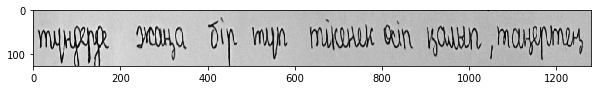

түндерде жаңа бір түп тікенек өсіп қалып, таңертең


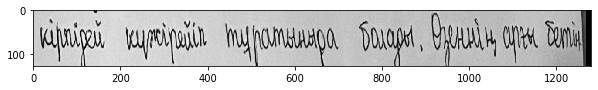

кірпідей күжірейіп тұратыныда болады. Өзеннің арғы бетін


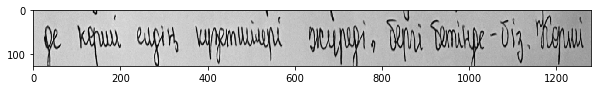

де көрші елдің күзетшілері жүреді, бергі бетінде — біз. Көрші


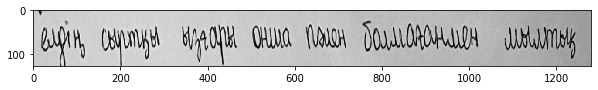

елдің сыртқы ызғары онша пəлен болмағанмен мылтық


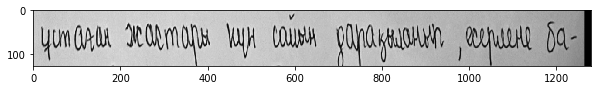

ұстаған жастары күн сайын дарақыланып, есерленe ба


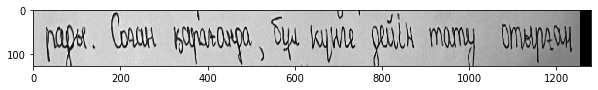

рады. Соған қарағанда, бұл күнге дейін тату отырған


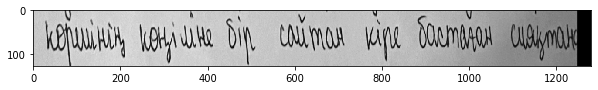

көршінің көңіліне бір сайтан кіре бастаған сияқтана


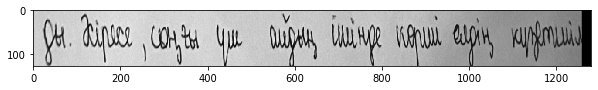

ды. Əсіресе, соңғы үш айдың ішінде көрші елдің күзетшіл


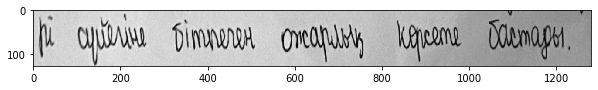

рі сүйегіне бітпеген ожарлық көрсете бастады.


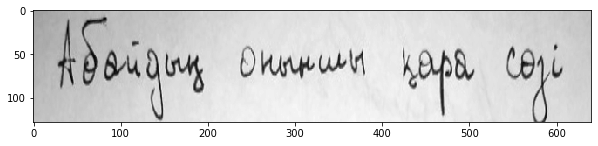

Абайдың оныншы қара сөзі


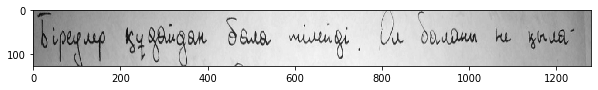

Біреулер құдайдан бала тілейді. Ол баланы не қыла


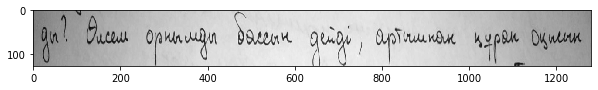

ды? Өлсем орнымды бассын дейді, артымнан құран оқысын


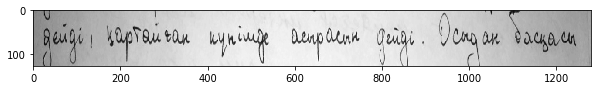

дейді, қартайған күнімде асырасын дейді. Осыдан басқасы


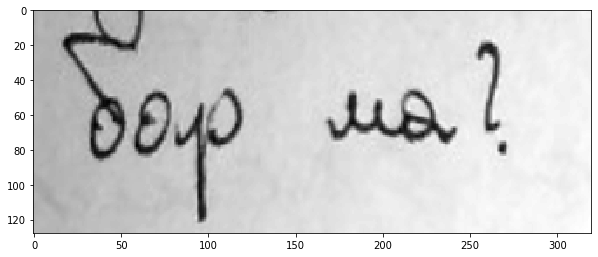

бар ма?


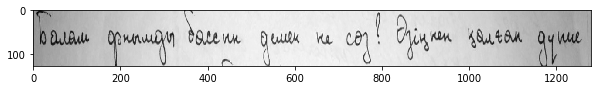

Балам орнымды бассын демек не сөз? Өзіңнен қалған дүние


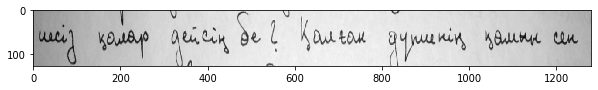

иесіз қалар дейсің бе? Қалған дүниенің қамын сен


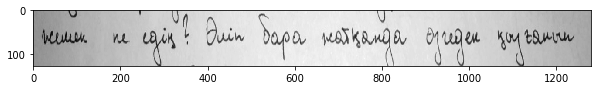

жемек пе едің? Өліп бара жатқанда өзгеден қызғанып


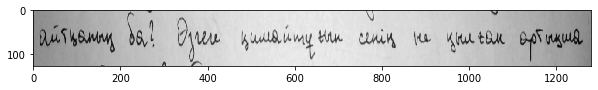

айтқаның ба? Өзгеге қимайтұғын сенің не қылған артықша


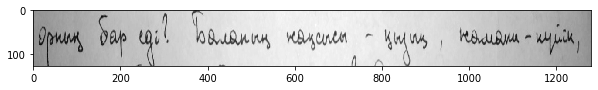

орның бар еді? Баланың жақсысы  қызық, жаманы  күйік,


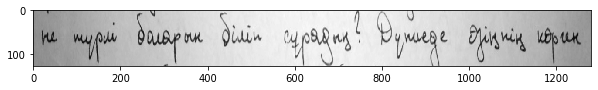

не түрлі боларын біліп сұрадың? Дүниеде өзіңнің көрген


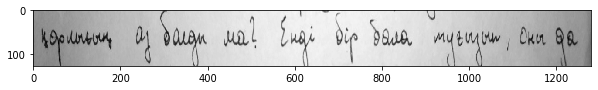

қорлығың аз болды ма? Енді бір бала туғызып, оны да


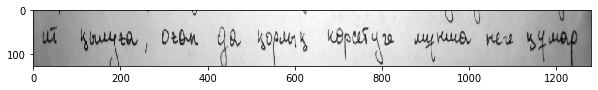

ит қылуға, оған да қорлық көрсетуге мұнша неге құмар


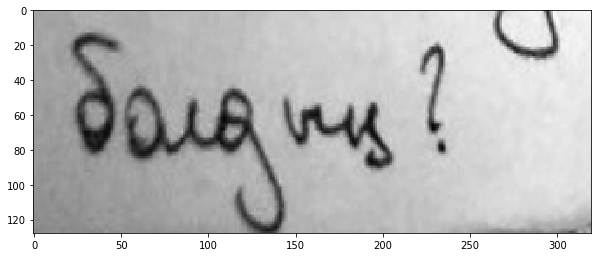

болдың?


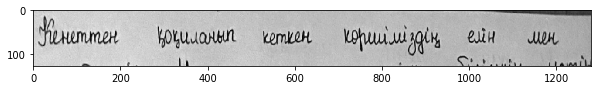

Кенеттен қоқиланып кеткен көршіміздің елін мен


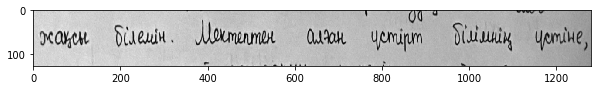

жақсы білемін. Мектептен алған үстірт білімнің үстіне,


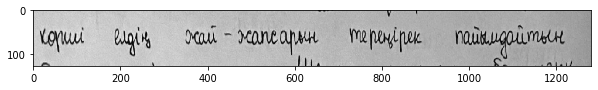

көрші елдің жайжапсарын тереңірек пайымдайтын


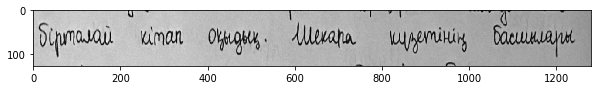

бірталай кітап оқыдық. Шекара күзетінің басшылары


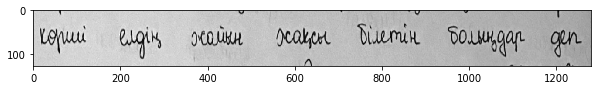

көрші елдің жайын жақсы білетін болыңдар деп


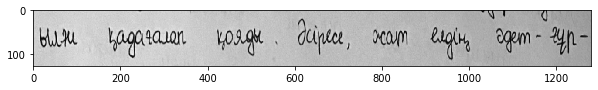

ылғи қадағалап қояды. Əсіресе, жат елдің əдетғұр


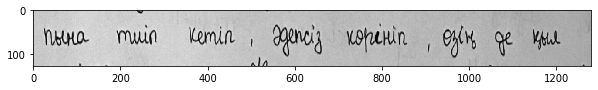

пына тиіп кетіп, əдепсіз көрініп, өзің де қыл


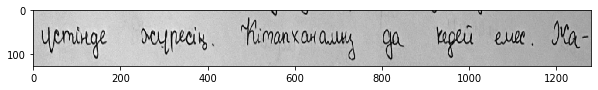

үстінде жүресің. Кітапханамыз да кедей емес. Жа


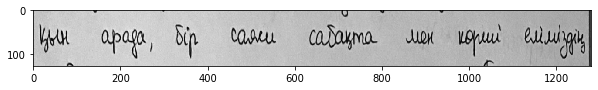

қын арада, бір саяси сабақта мен көрші еліміздің


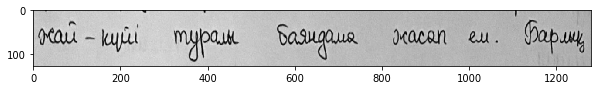

жайкүйі туралы баяндама жасап ем. Барлық


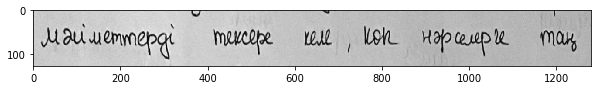

мəліметтерді тексере келе, көп нəрселерге таң


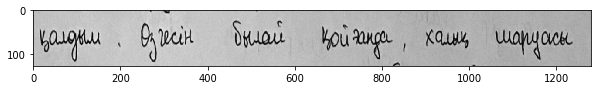

қалдым. Өзгесін былай қойғанда, халық шаруасы


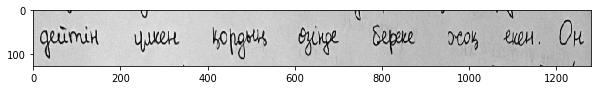

дейтін үлкен қордың өзінде береке жоқ екен. Он


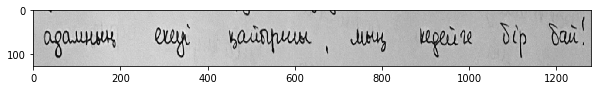

адамның екеуі қайыршы, мың кедейге бір бай!


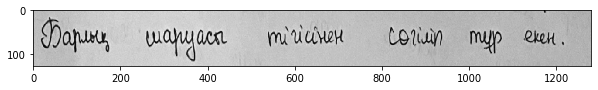

Барлық шаруасы тігісінен сөгіліп тұр екен.


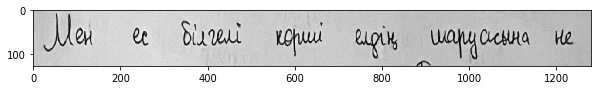

Мен ес білгелі көрші елдің шаруасына не


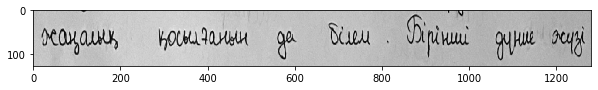

жаңалық қосылғанын да білем. Бірінші дүние жүзі


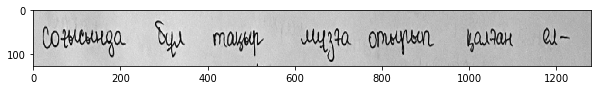

соғысында бұл тақыр мұзға отырып қалған ел


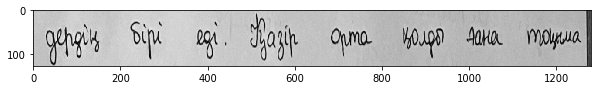

дердің бірі еді. Қазір орта қолды ғана тоқыма


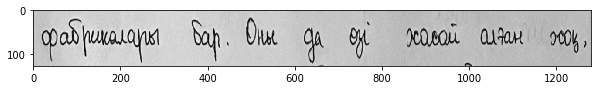

фабрикалары бар. Оны да өзі жасай алған жоқ,


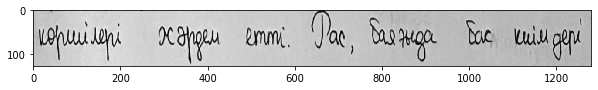

көршілері жəрдем етті. Рас, баяғыда бас киімдері


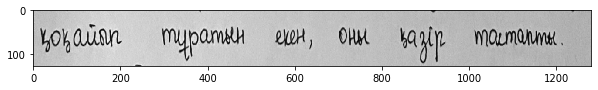

қоқайып тұратын екен, оны қазір тастапты.


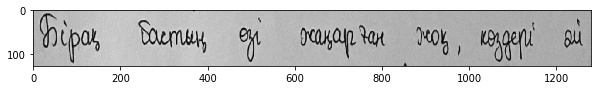

Бірақ бастың өзі жаңарған жоқ, көздері əлі


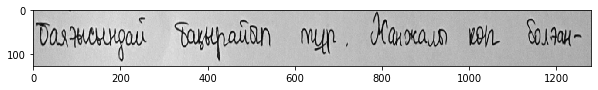

баяғысындай бақырайып тұр. Жанжалы көп болған


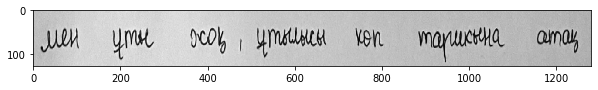

мен ұтысы жоқ, ұтылысы көп тарихына атақ


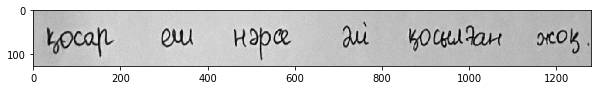

қосар еш нəрсе əлі қосылған жоқ.


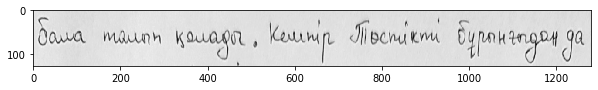

бала талып қалады. Кемпір Төстікті бұрынғыдан да


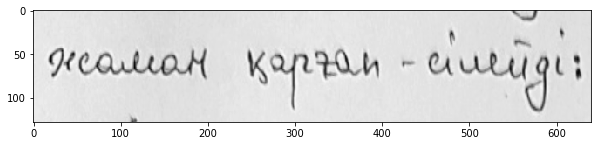

жаман қарғапсілейді:


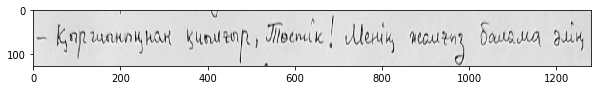

 Қыршыныңнан қиылғыр, Төстік! Менің жалғыз балама әлің


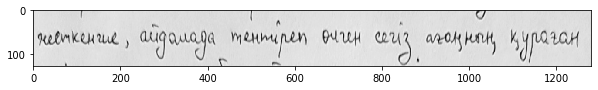

жеткенше, айдалада тентіреп өлген сегіз ағаңның қураған


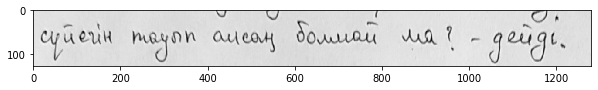

сүйегін тауып алсаң болмай ма?  дейді.


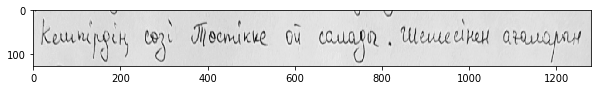

Кемпірдің сөзі Төстікке ой салады. Шешесінен ағаларын


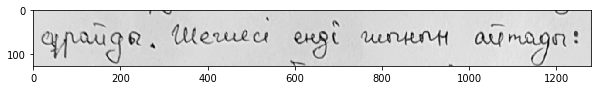

сұрайды. Шешесі енді шынын айтады:


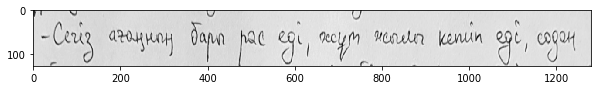

 Сегіз ағаңның бары рас еді, жұт жылы кетіп еді, содан


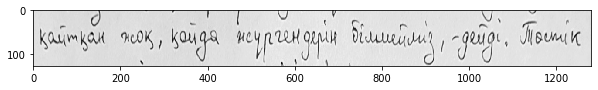

қайтқан жоқ, қайда жүргендерін білмейміз,  дейді. Төстік


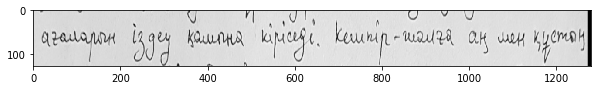

ағаларын іздеу қамына кіріседі. Кемпіршалға аң мен құстың


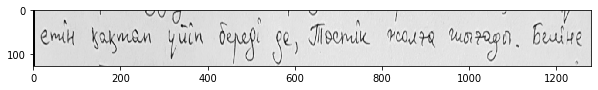

етін қақтап үйіп береді де, Төстік жолға шығады. Беліне


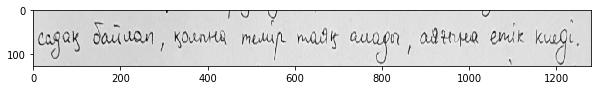

садақ байлап, қолына темір таяқ алады, аяғына етік киеді.


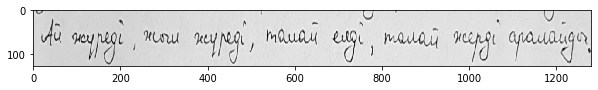

Ай жүреді, жыл жүреді, талай елді, талай жерді аралайды.


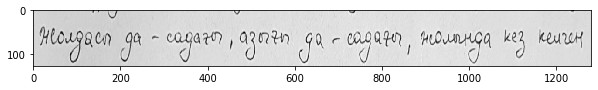

Жолдасы да  садағы, азығы да  садағы, жолында кез келген


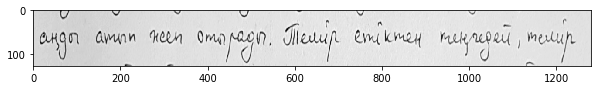

аңды атып жеп отырады. Темір етіктен теңгедей, темір


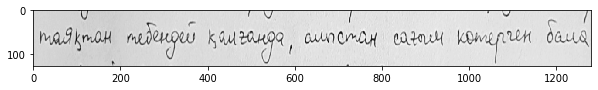

таяқтан тебендей қалғанда, алыстан сағым көтерген бала


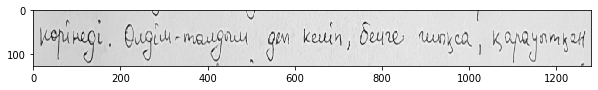

көрінеді. Өлдімталдым деп келіп, белге шықса, қарауытқан


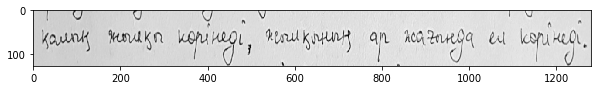

қалың жылқы көрінеді, жылқының ар жағында ел көрінеді.


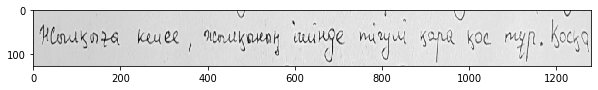

Жылқыға келее, жылқының ішінде тігулі қара қос тұр. Қосқа


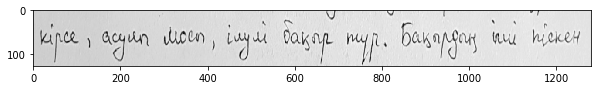

кірсе, асулы мосы, ілулі бақыр түр. Бақырдың іші піскен


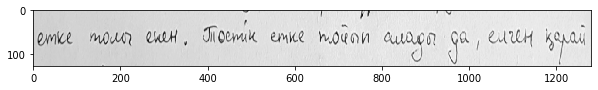

етке толы екен. Төстік етке тойып алады да, елген қарай


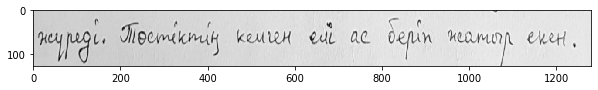

жүреді. Төстіктің келген елі ас беріп жатыр екен.


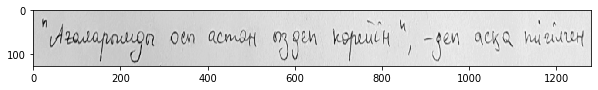

"Ағаларымды осы астан іздеп көрейін",  деп асқа тігілген


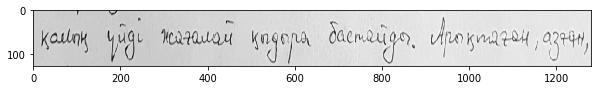

қалың үйді жағалай қыдыра бастайды. Арықтаған, азған,


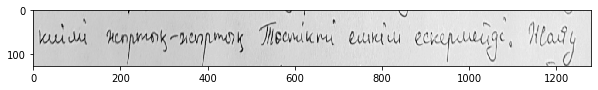

киімі жыртықжыртық Төстікті ешкім ескермейді. Жаяу


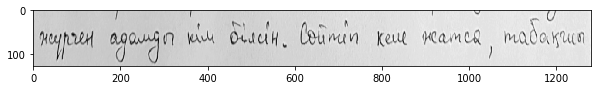

жүрген адамды кім білсін. Сөйтіп келе жатса, табақшы


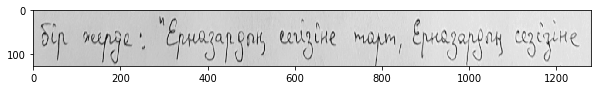

бір жерде: "Ерназардың сегізіне тарт, Ерназардың сезізіне


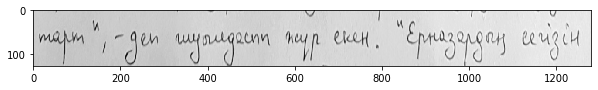

тарт",  деп шуылдасып жүр екен. "Ерназардың сегізін


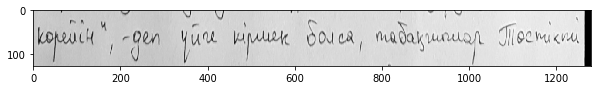

көрейін",  деп үйге кірмек болса, табақшылар Төстікті


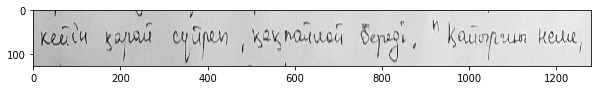

кейін қарай сүйреп, қақпайлай береді. "Қайыршы неме,


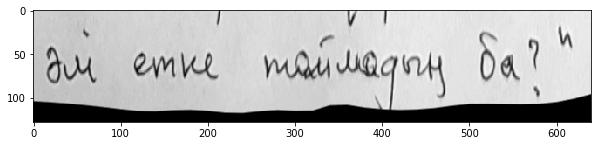

әлі етке тоймадың ба?"


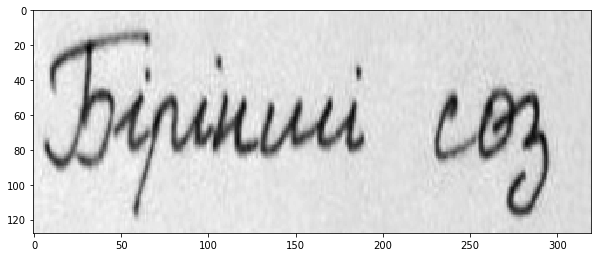

Бірінші сөз


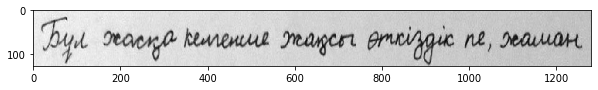

Бұл жасқа келгенше жақсы өткіздік пе, жаман


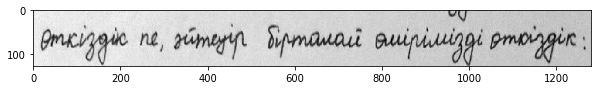

өткіздік пе, әйтеуір бірталай өмірімізді өткіздік:


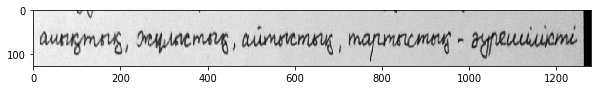

алықтық, жұлыстық, айтыстық, тартыстық  әурешілікті


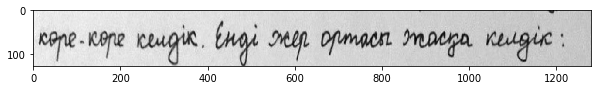

көрекөре келдік. Енді жер ортасы жасқа келдік:


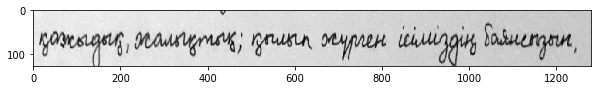

қажыдық, жалықтық; қылып жүрген ісіміздің баянсызын,


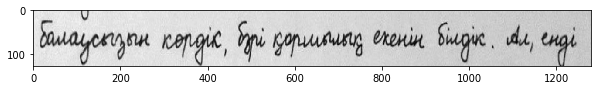

байлаусызын көрдік, бәрі қоршылық екенін білдік. Ал, енді


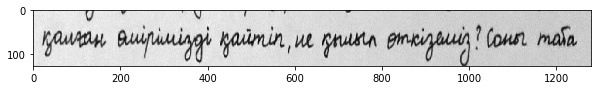

қалған өмірімізді қайтіп, не қылып өткіземіз? Соны таба


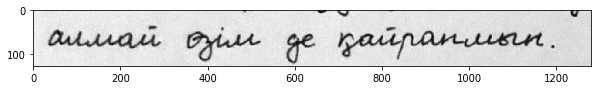

алмай өзім де қайранмын.


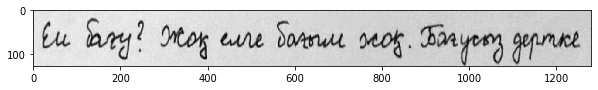

Ел бағу? Жоқ, елге бағым жоқ. Бағусыз дертке


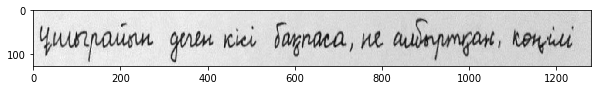

ұшырайын деген кісі бақпаса, не албыртқан, көңілі


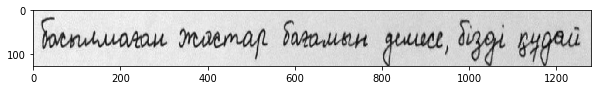

басылмаған жастар бағамын демесе, бізді құдай


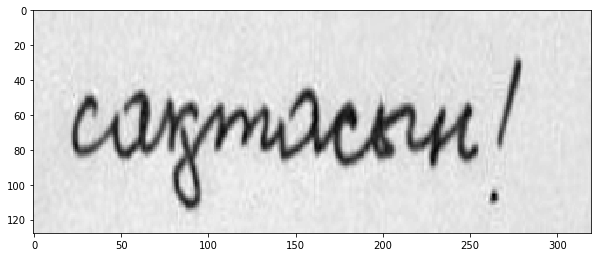

сақтасын!


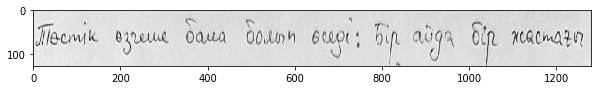

Төстік өзгеше бала боп өседі: бір айда бір жастағы


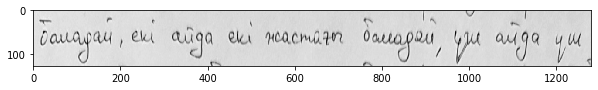

баладай, екі айда екі жастағы баладай, үш айда үш


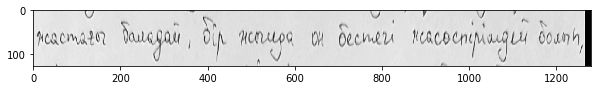

жастағы баладай, бір жылда он бестегі жасөспірімдей болып,


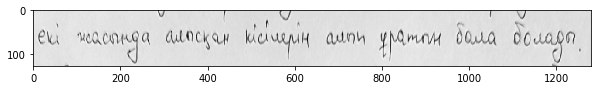

екі жасында алысқан кісілерін алып ұратын бала болады.


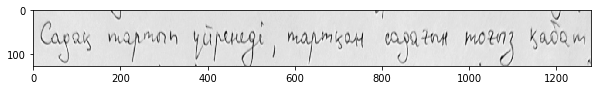

Садақ тартып үйренеді, тартқан садағын тоғыз қабат


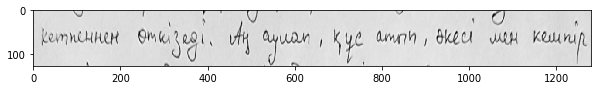

кетпеннен өткізеді. Аң аулап, құс атып, әкесі мен кемпір


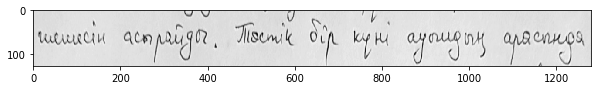

шешесін асырайды. Төстік бір күні ауылдың арасында


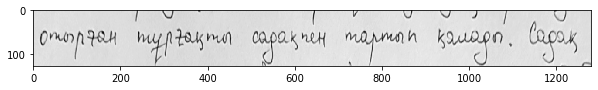

отырған тұрғақты садақпен тартып қалады. Садақ


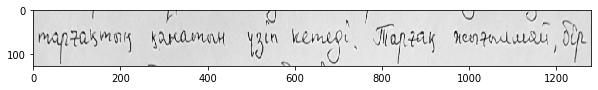

тарғақтың қанатын үзіп кетеді. Тарғақ жығылмай, бір


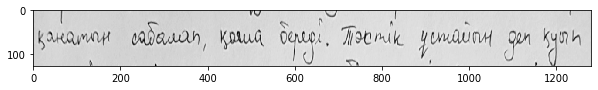

қанатын сабалап, қаша береді. Төстік ұстайын деп қуып


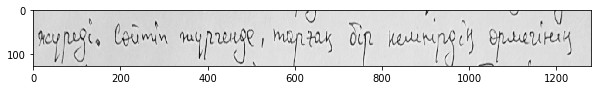

жүреді. Сөйтіп жүргенде, тарғақ бір кемпірдің өрмегінің


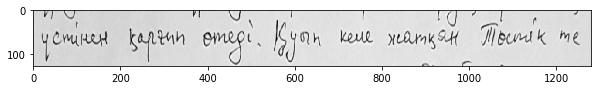

үстінен қарғып өтеді. Қуып келе жатқан Төстік те


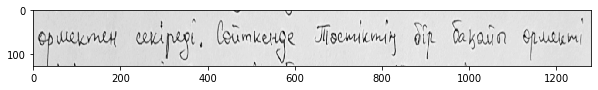

өрмектен секіреді. Сөйткенде Төстіктің бір бақайы өрмекті


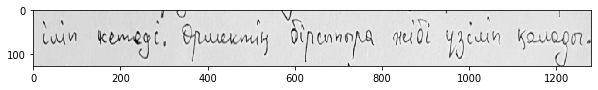

іліп кетеді. Өрмектің бірсыпыра жібі үзіліп қалады.


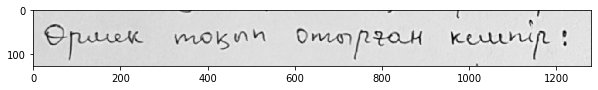

Өрмек тоқып отырған кемпір:


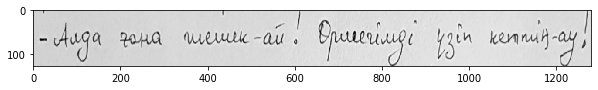

 Алда ғана шешекай! Өрмегімді үзіп кеттіңау!


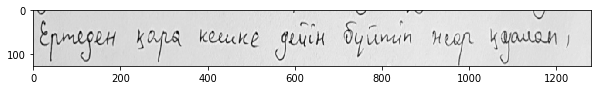

Ертеден қара кешке дейін бүйтіп жар қуалап,


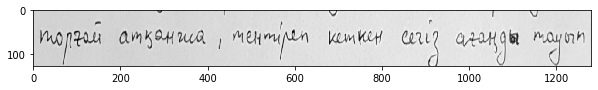

торғай атқанша, тентіреп кеткен сегіз ағаңды тауып


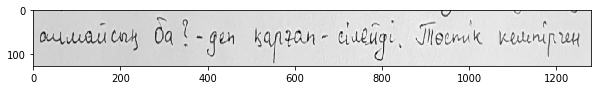

алмайсың ба?  деп қарғапсілейді.  Төстік кемпірген


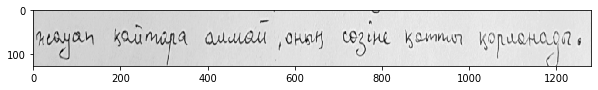

жауап қайтара алмай, оның сөзіне қатты қорланады.


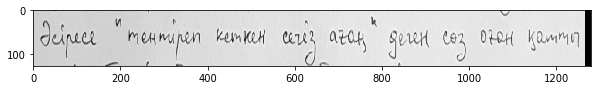

Әсіресе "тентіреп кеткен сегіз ағаң" деген сөз оған қатты


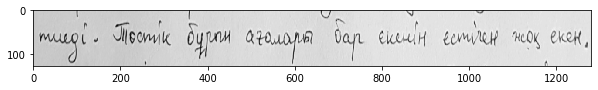

тиеді. Төстік бұрын ағалары бар екенін естіген жоқ екен.


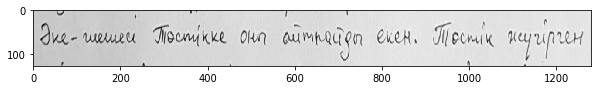

Әкешешесі Төстікке оны айтпайды екен. Төстік жүгірген


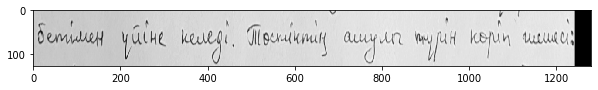

бетімен үйіне келеді. Төстіктің ашулы түрін көріп шешесі:


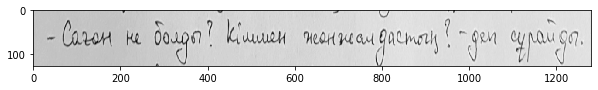

 Саған не болды? Кіммен жанжалдастың?  деп сұрайды.


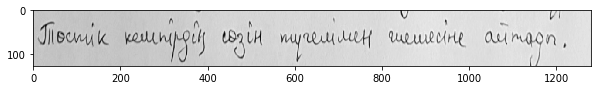

Төстік кемпірдің сөзін түгелімен шешесіне айтады.


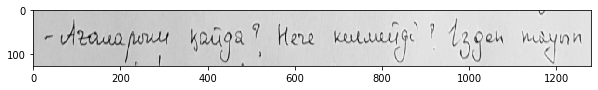

 Ағаларым қайда? Неге келмейді? Іздеп тауып


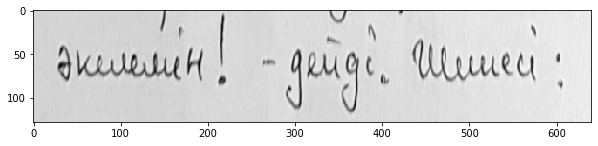

әкелемін!  дейді. Шешесі:


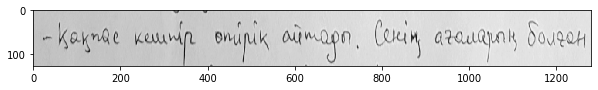

 Қақпас кемпір өтірік айтады. Сенің ағаларың болған


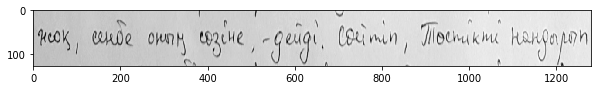

жоқ, сенбе оның сөзіне,  дейді. Сөйтіп, Төстікті нандырып


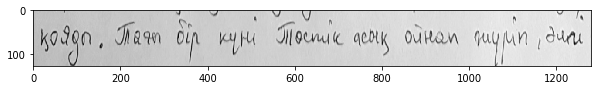

қояды. Тағы бір күні Төстік асық ойнап жүріп, әлгі


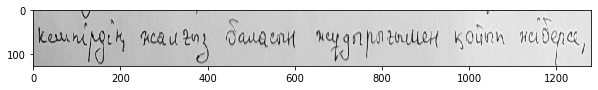

кемпірдің жалғыз баласын жұдырығымен қойып жіберсе,


In [23]:
path = prefix + 'data/ready/'
papers = list(sorted(glob.glob(path + '*'), key=lambda p: int(p.split('/')[-1])))
dataset = DatasetManager(papers)

items = []
for paper in dataset:
    for line in paper:
        items.append([paper, line])
        
print(len(items))
                
train_dataset = HwDataset(items, augmentation=False)

# print(len(train_dataset))

for i in range(len(train_dataset)):
    img = train_dataset[i][0]
    plt.figure(figsize=(10, 10))
    plt.imshow(img, cmap='gray')
    plt.show()
    print(train_dataset[i][1])
